## import all the stuff

In [1]:
%gui qt
%matplotlib inline
from PIL import Image
from csbdeep.utils import Path, normalize
from glob import glob
from importlib import reload 
from magicgui import magicgui
from magicgui.widgets import Label, SpinBox, PushButton, Text, Container
from manager.acquisition import acq, acq_stim, acq_multi, acq_multi_dark, acq_mask
from manager.dmd import dmd as dmd_class
from manager.fov import FOV
from manager.preset import preset
from manager.stage import load_pos_file, get_pos_from_mm, stage_position
from matplotlib import pyplot as plt 
from multiprocessing import Process
from napari.layers import Image, Labels
from napari.qt import thread_worker
from pipeline.pipeline_single_frame import add_frame
from pipeline.stimulation import stim_random
from pycromanager import Acquisition, multi_d_acquisition_events
from pycromanager import Bridge
from semantic_segmentation import init_VGG16_pyramid, fd_VGG16_pyramid
from skimage import io
from skimage.color import label2rgb
from skimage.measure import regionprops_table
from skimage.morphology import square
from skimage.segmentation import expand_labels
from sklearn.ensemble import RandomForestClassifier
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
from stardist.models import StarDist2D
from tqdm import tqdm
from utils import create_folders
import cv2
import gc
import glob
import importlib.util
import math
import matplotlib
import matplotlib.pyplot as plt
import napari
import nest_asyncio
import numpy as np
import os
import pandas as pd
import pickle as pkl
import queue
import scipy
import skimage
import threading
import time
import trackpy as tp
matplotlib.rcParams["image.interpolation"] = None
nest_asyncio.apply()

## Setup connection with micro manager

In [2]:
bridge = Bridge() #connection to micro-manager
core = bridge.get_core()
studio = bridge.get_studio()
print(bridge.get_core())
dmd = dmd_class(core) #init dmd device

## Set up basic microscope config (light path, hardware triggering, binning etc)

In [3]:
nidaq_setup = preset(core) #focus preset
nidaq_setup.settings = [

    ["Spectra RIGHT","Teal_Level",100],
    ["Spectra RIGHT","Teal_Enable",0],
    ["Spectra RIGHT","Cyan_Level",100],
    ["Spectra RIGHT","Cyan_Enable",0],
    ["Spectra RIGHT","Violet_Level",100],
    ["Spectra RIGHT","Violet_Enable",0],
    ["Spectra RIGHT","Green_Level",100],
    ["Spectra RIGHT","Green_Enable",0],
    ["Spectra RIGHT","Blue_Level",100],
    ["Spectra RIGHT","Blue_Enable",0],
    ["Spectra RIGHT","Red_Level",100],
    ["Spectra RIGHT","Red_Enable",0],

    ["Spectra RIGHT","White_Enable",0],
    ['Andor sCMOS LEFT','AuxiliaryOutSource (TTL I/O)','FireAny']
]
nidaq_setup.apply_no_retry()

camera_setup = preset(core) #focus preset
camera_setup.settings = [
    ["Andor sCMOS LEFT","Binning",'2x2'],
    #["Andor sCMOS LEFT","Sensitivity/DynamicRange",'12-bit (low noise)'],
    #["Andor sCMOS LEFT","Exposure",'300'],
    #["Andor sCMOS LEFT","TriggerMode",'Software (Recommended for Live Mode)'],
    ["TILightPath","State",'2'],
    ["Mosaic3","TriggerMode",'InternalExpose'], #InternalSoftware
    #["Andor sCMOS LEFT","PixelReadoutRate",'200 MHz - lowest noise'],
]

camera_setup.apply(core)

Andor sCMOS LEFT: Set Binning to 2x2
TILightPath: Set State to 2
Mosaic3: Set TriggerMode to InternalExpose


## Load some test data to if the spot-drawing function works

In [4]:
expose_UV = preset(core)
# 555/25 with same filterwheel as H2B or 575 with 2/2
expose_UV.settings = [
    ["Spectra RIGHT","Teal_Enable",0],
    ["Spectra RIGHT","Cyan_Enable",0],
    ["Spectra RIGHT","Violet_Enable",1],
    ["Spectra RIGHT","Blue_Enable",0],
    ["Spectra RIGHT","Red_Enable",0],

    ["TIFilterBlock1", "State", "1"],#2 
    ["Wheel-C", "State", 1],# could also use 1 # standard  2
    ["Spectra RIGHT","Green_Enable",0],
    ["Spectra RIGHT","Violet_Level",100] #25
]
expose_UV.camera_exposure_time = 250 #150
expose_UV.dmd_exposure_time = 150
expose_UV.name = 'expose_UV'
expose_UV.apply(core)
dmd.all_on()

Spectra RIGHT: Set Teal_Enable to 0
Spectra RIGHT: Set Cyan_Enable to 0
Spectra RIGHT: Set Violet_Enable to 1
Spectra RIGHT: Set Blue_Enable to 0
Spectra RIGHT: Set Red_Enable to 0
TIFilterBlock1: Set State to 1
Wheel-C: Set State to 1
Spectra RIGHT: Set Green_Enable to 0
Spectra RIGHT: Set Violet_Level to 100


## Check pattern (red laser)

In [5]:
check_RED = preset(core)
#IRFP
check_RED.settings = [ # Actin used for segmentation
    ["TIFilterBlock1", "State", "1"],
    ["Wheel-C", "State", 2],  # filter no 2 lets red light through - needed to check with reflected light
    ["Spectra RIGHT","Teal_Enable",0],
    ["Spectra RIGHT","Cyan_Enable",0],
    ["Spectra RIGHT","Violet_Enable",0],
    ["Spectra RIGHT","Green_Enable",0],
    ["Spectra RIGHT","Blue_Enable",0],

    ["Spectra RIGHT","Red_Enable",1],
    ["Spectra RIGHT","Red_Level",50] #75
    
]
check_RED.camera_exposure_time = 5 #500
check_RED.dmd_exposure_time = 250
check_RED.name = "check_RED"
check_RED.apply()
dmd.all_on()
#dmd.checker_board()


In [6]:
calibration_WHITE = preset(core)
#IRFP
calibration_WHITE.settings = [ # Actin used for segmentation
    ["TIFilterBlock1", "State", "1"],
    ["Wheel-C", "State", 1],#
    ["Spectra RIGHT","Teal_Enable",1],
    ["Spectra RIGHT","Cyan_Enable",1],
    ["Spectra RIGHT","Violet_Enable",1],
    ["Spectra RIGHT","Green_Enable",1],
    ["Spectra RIGHT","Blue_Enable",1],

    ["Spectra RIGHT","Red_Enable",1],
    ["Spectra RIGHT","Teal_Level",100], #75
    ["Spectra RIGHT","Cyan_Level",100], #75
    ["Spectra RIGHT","Violet_Level",10], #75
    ["Spectra RIGHT","Blue_Level",100], #75
    ["Spectra RIGHT","Green_Level",100] #75
    
]
calibration_WHITE.camera_exposure_time = 2 #500
calibration_WHITE.dmd_exposure_time = 250
calibration_WHITE.name = "calibration_WHITE"
calibration_WHITE.apply()
dmd.all_on()
#dmd.checker_board()


In [7]:
dmd.checker_board()

In [8]:
dmd.all_off()

In [9]:
dmd.all_on()

In [10]:
mask = io.imread('/Users/micro-manager/Desktop/0.png')

In [11]:
mask = io.imread('/Users/micro-manager/Desktop/1.png')
mask = mask[:,:,0]
dmd.display_mask(mask)

## Turn off all lights

In [12]:
black = preset(core)
black.settings = [
    ["Spectra RIGHT","Teal_Enable",0],
    ["Spectra RIGHT","Cyan_Enable",0],
    ["Spectra RIGHT","Violet_Enable",0],
    ["Spectra RIGHT","Green_Enable",0],
    ["Spectra RIGHT","Blue_Enable",0],
    ["Spectra RIGHT","Violet_Enable",0],
    ["Wheel-C", "State", 0],

]
black.name = 'BLACK'
black.apply()

### Add all channels to the list that should show up in interface

In [13]:
channels = [expose_UV,check_RED,calibration_WHITE,black]

## NAPARI LIVE VIEW

### Settings (running this deletes all positions)

In [14]:
# data acquired on microscope or simulated?
simulate = False
clip =[1024, 1024]
# um / px, for correct scaling in napari
size_um = [0.16, 0.16]
#Time between checking again if new image is available
sleep_time = 0.05
# contrast limits for display
clim = [0, 300]

# initialize global variables
# flag to break while loops
acq_running = False
# empty queue for image data and z positions
img_queue = queue.Queue()
# xyz data stack
data = np.random.rand(clip[0], clip[1]) * clim[1]
zmq_lock = threading.Lock()
position_list = []

### Open napari live-view

In [15]:
import cv2
font = cv2.FONT_HERSHEY_DUPLEX
checker_board = np.kron([[1, 0] * 20, [0, 1] * 20] * 20, np.ones((20, 20))) #https://stackoverflow.com/a/37440123
startup_screen = checker_board*100
cv2.putText(startup_screen,'github.com/hinderling',(40,780), font, 2,(255),2)
#plt.imshow(startup_screen)
data = startup_screen

def acquire_data_single_frames():
    global zmq_lock
    zmq_lock.acquire()
    image = acq(core)
    zmq_lock.release()
    
    #print('run grab_image')
    place_data(image)
    
def acquire_data():
    global channels
    global img_queue

    #array = live_manager.snap(False)
    zmq_lock.acquire()
    remaining_image_count = core.get_remaining_image_count()
    zmq_lock.release()
    if remaining_image_count < 1:
        print('No image in uManager queue.')
        time.sleep(0.5)
        return
    
    zmq_lock.acquire()
    array = core.get_last_image()
    #core.clear_circular_buffer()
    zmq_lock.release()
    img_width = int(math.sqrt(len(array)))
    img = np.reshape(array, (img_width,img_width))
    img = img[:,:]
    img_queue.put([channels[1], img])
    return

def acquire_data_single_frames():
    global zmq_lock
    zmq_lock.acquire()
    image = acq(core)
    zmq_lock.release()
    
    #print('run grab_image')
    place_data(image)
    
def acquire_data():
    global channels
    global img_queue

    #array = live_manager.snap(False)
    zmq_lock.acquire()
    remaining_image_count = core.get_remaining_image_count()
    if remaining_image_count < 1:
        zmq_lock.release()
        print('Warning: No image in uManager queue.')
        time.sleep(0.5)
        return
    try:
        array = core.get_last_image()
    except:
        print('ERROR: No image in uManager queue.')
        time.sleep(0.5)
        return

    zmq_lock.release()
    img_width = int(math.sqrt(len(array)))
    img = np.reshape(array, (img_width,img_width))
    img = img[::2,::2]
    img_queue.put([channels[1], img])
    return

def display_napari(image):
    """ Unpacks z position and reshapes image from pos_img. Writes image into correct
        slice of data, and updates napari display.
        Called by worker thread yielding elements from queue.
        Needs to be in code before worker thread connecting to it.
        Inputs: array pos_img: queue element containing z position and raveled image data.
        Global variables: np.array data: contains image stack
            img_queue: needed only to send task_done() signal.
    """
    global data
    global img_queue
    channel = image[0]
    image= image[1]
    layers[0].data = image
    img_queue.task_done()

@thread_worker
def append_img(img_queue):
    """ Worker thread that adds images to a list.
        Calls either micro-manager data acquisition or functions for simulating data.
        Inputs: img_queue """

    # start microscope data acquisition
    print('Worker started: append_img')
    if not simulate:
         while acq_running:
            acquire_data()
            time.sleep(sleep_time)

    # run with simulated data
    else:
        ii = 0
        while acq_running:
            simulate_data(ii)
            ii = ii + 1
            #print("appending to queue", ii)
            time.sleep(sleep_time)


@thread_worker(connect={'yielded': display_napari})
def yield_img(img_queue):
    """ Worker thread that checks whether there are elements in the
        queue, reads them out.
        Connected to display_napari function to update display """
    print('Worker started: yield_img')
    global acq_running
    
    #time_last_frame = time.time()
    #print('yield image')
    
    #print(acq_running)
    while acq_running:
        #time.sleep(sleep_time)
        # get elements from queue while there is more than one element
        # playing it safe: I'm always leaving one element in the queue
        img_queue_size = img_queue.qsize()
        #print(img_queue_size)
        while img_queue.qsize() > 0:
           # print("reading from queue ", img_queue.qsize())
            yield img_queue.get(block = False)
            #time_this_frame = time.time()
            #time_diff = time_this_frame - time_last_frame
            #fps = int(1/time_diff)
        time.sleep(sleep_time)

    # read out last remaining elements after end of acquisition
    while img_queue.qsize() > 0:
        yield img_queue.get(block = False)
    print("acquisition done")
@magicgui(call_button = "Start")
def start_acq():
    """ Called when Start button in pressed. Starts workers and resets global variables"""
    print("starting threads...")
    global acq_running
    global channels
    global zmq_lock
    if not acq_running:
        #z_range[3] = 0
        acq_running = True
        zmq_lock.acquire()
        core.start_continuous_sequence_acquisition(0)
        zmq_lock.release()
        worker1 = append_img(img_queue)
        worker2 = yield_img(img_queue)
        worker1.start()
        #worker2.start() # doesn't need to be started bc yield is connected
    else:
        print("acquisition already running!")

threshold = 100

@magicgui(slider_float={"widget_type": "FloatSlider", 'max': 1000})
def set_treshold(slider_float=100):
    global threshold
    threshold = slider_float

@magicgui(call_button = "Stop")
def stop_acq():
    print("stopping threads")
    # set global acq_running to False to stop other workers
    global acq_running
    global core
    global zmq_lock
    
    zmq_lock.acquire()
    core.stop_sequence_acquisition()    
    zmq_lock.release()
    acq_running = False

    
#a channel is a preset that has EXPOSURE and POWER function
channels_widget = Container()
channels_widgets_list = []
for channel in channels:
    @magicgui(
    call_button = 'SELECT',
    auto_call=False,
    label = {"widget_type": "Label","name":"label","label":channel.name},
    power={"widget_type": "SpinBox","name":"power" ,"label":'%',"min":0,"max": 100},
    exposure={"widget_type": "SpinBox","name":"ms" ,"label":'ms',"min":1,"max": 10000},
    #mode={"choices": ["reflect", "constant", "nearest", "mirror", "wrap"]},
    layout='horizontal',
    channel={'bind': channel} #replace this with channel 
    )
    def channel(label, power: int = channel.settings[-1][2], exposure=channel.camera_exposure_time, channel = channel):
        global channels
        print(channel.name)
        stop_acq()
        channel.camera_exposure_time = exposure
        channel.set_power(power)
        zmq_lock.acquire()
        channel.apply()
        dmd.all_on()
        zmq_lock.release()
        start_acq()
    channels_widgets_list.append(channel)

channels_widget = Container(widgets=(channels_widgets_list))
        
    
    
@magicgui(call_button = "DMD Checkerboard pattern")
def set_dmd_checkerboard():
    stop_acq()
    zmq_lock.acquire()
    dmd.checker_board()
    zmq_lock.release()
    start_acq()
        

        
@magicgui(call_button = "Store position")
def store_pos():
    global channels
    global zmq_lock
    global acq_running
    global position_list
    restart = False
    if acq_running:
        stop_acq()
        restart = True
    zmq_lock.acquire()
    point = core.get_xy_stage_position()
    pfs_offset = core.get_auto_focus_offset()
    x = point.get_x()
    y = point.get_y()
    zmq_lock.release()
    position_list.append(stage_position(x,y,pfs_offset))
    if restart:
        start_acq()   
        
        


        
# check if viewer is already open
# if yes: close and reopen
try:
    if viewer:
        viewer.close()
except:
    print("viewer already closed or never opened")
viewer = napari.Viewer(ndisplay=2)

# initialize napari viewer with stack view and random data, reslice view
#scale = [(z_range[1]-z_range[0])/z_range[2]*z_scale, size_um[1], size_um[0]]
layers = [viewer.add_image(data,
                        name = 'zero',
                        colormap = 'gray',
                        interpolation = 'nearest',
                        blending = 'additive',
                        rendering = 'attenuated_mip',
                        #scale = scale,
                        contrast_limits = clim)
         ]

#viewer.dims._roll()
viewer.window.add_dock_widget(start_acq,area='left')
viewer.window.add_dock_widget(stop_acq,area='left')
viewer.window.add_dock_widget(channels_widget,area='left') 
viewer.window.add_dock_widget(store_pos,area='left')
viewer.window.add_dock_widget(set_dmd_checkerboard,area='left')

viewer.text_overlay.visible = True
#viewer.window.qt_viewer.canvas.measure_fps(callback=update_fps)    

viewer already closed or never opened
starting threads...
Worker started: yield_img
Worker started: append_img
check_RED
stopping threads
acquisition done
starting threads...
Worker started: append_img
Worker started: yield_img
expose_UV
stopping threads
acquisition done
starting threads...
Worker started: yield_img
Worker started: append_img


In [16]:
break

SyntaxError: 'break' outside loop (<ipython-input-16-6aaf1f276005>, line 1)

In [ ]:
## Import the positions from MM (not used anymore)
# position_list = get_pos_from_mm(studio)

In [2]:
### removing positions
len(position_list)
#position_list.pop(0)

#position_list = position_list[1:]


NameError: name 'position_list' is not defined

## STORE THE POSITIONS

In [ ]:
#Store List
with open('C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\four_corners_glass_slide_single_pos.pkl', "wb") as fp:   #Pickling
    pkl.dump(position_list, fp)

In [16]:
#Load List
with open('C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\four_corners_glass_slide_single_pos.pkl', "rb") as fp:   #Pickling
    position_list = pkl.load(fp)

In [17]:
xs = []
ys = []
for i,pos in enumerate(position_list):
    xs.append(pos.x)
    ys.append(pos.y)
y_start = np.min(ys)
y_stop = np.max(ys)
x_start = np.min(xs)
x_stop = np.max(xs)

## PREVIEW THE POSITIONS

change `nb_patterns` for count of different patterns

In [79]:
position_list_interp = []
pattern_ids = []
exposure_times = []

#Position of pattern on slide
x_positions = np.linspace(x_start,x_stop,51)
y_positions = np.linspace(y_start,y_stop,21)

#Count of pattern
nb_patterns = 1
for i, x_pos in enumerate(x_positions):
    for j, y_pos in enumerate(y_positions):
        
        
    #Threshold of x and y axis to make pattern. Coordinate max and min.
        #X-AXIS
        if i <10 or i>40:
            continue


        #Y-AXIS
        if j <5 or j>15:
            continue    
            
            
        #empty row between groups of 4x4    
        if i%5==0 or j%5==0:
            continue
            
       # if i < 5 and j < 5:
       #     pattern_id = 0
       # if i < 5 and j > 5:
       #     pattern_id = 1
       # if i > 5 and j < 5:
       #     pattern_id = 2
       # if i > 5 and j > 5:
       #     pattern_id = 3
   
        pattern_id = int((i/5/2+0.0)%nb_patterns)
            
    #    if i == 0 or i == 6:
    #        exposure_times.append(2000)
    #    elif i == 1 or i == 7:
    #        exposure_times.append(5000)
    #    elif i == 2 or i == 8:
    #        exposure_times.append(10000)
    #    elif i == 3 or i == 9:
    #        exposure_times.append(10000)
    #    elif i == 4 or i == 10:
        exposure_times.append(50)
            
        pattern_ids.append(pattern_id)
        pos = stage_position(x_pos,y_pos,None)
        position_list_interp.append(pos)

exposure_times = np.array(exposure_times).astype(np.double)

print(len(position_list_interp))
print(exposure_times, len(exposure_times))
print(pattern_ids, len(pattern_ids))

192
[50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.] 192
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

4


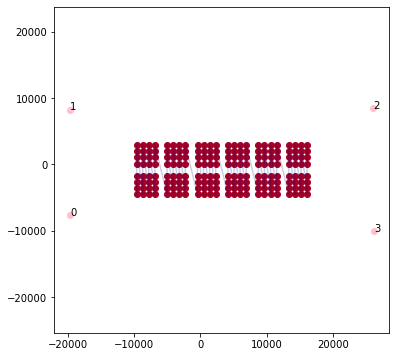

In [80]:
# preview positions
xs = []
ys = []
plt.figure(figsize= (6,6))

for i,pos in enumerate(position_list_interp):
    pattern_id = pattern_ids[i]
    color = color=plt.cm.RdYlBu(pattern_id/nb_patterns)
    plt.scatter(pos.x,pos.y,color =color)
    xs.append(pos.x)
    ys.append(pos.y)
    #plt.text(pos.x+100, pos.y, str(i))
for i,pos in enumerate(position_list):
    plt.scatter(pos.x,pos.y,c ='pink')
    plt.text(pos.x+100, pos.y, str(i))
print(len(position_list))
plt.plot(xs,ys,c = 'darkblue',alpha = 0.2)
plt.axis('equal')
plt.show()

In [51]:

#DENSE SPACING
#x_positions = np.linspace(x_start,x_stop,61)
#y_positions = np.linspace(y_start,y_stop,26)


space_between_patterns = 1500
x_repeats = 5
y_repeats = 5
pattern_repeats = 5

position_list_interp = []
pattern_ids = []
exposure_times = []

x_pos_start = position_list[0].x
y_pos_start = position_list[0].x


for pattern_repeat in range(pattern_repeats):
    
    for y_repeat in range(y_repeats):
        y_pos = y_pos_start-y_repeat*space_between_patterns

        for x_repeat in range(x_repeats):
            x_pos = x_pos_start-x_repeat*space_between_patterns

            if y_repeat %2 == 0:
                pattern_id =0
            else:
                pattern_id = 1
            exposure_times.append(25000)    
            pattern_ids.append(pattern_id)
            pos = stage_position(x_pos,y_pos,None)
            position_list_interp.append(pos)

        
    x_pos_start = x_pos_start-8*space_between_patterns
   
exposure_times = np.array(exposure_times).astype(np.double)

print(len(position_list_interp))
print(exposure_times, len(exposure_times))
print(pattern_ids, len(pattern_ids))

## Load affine transformation matrix from disk

the last one worked well so just load it from file (`affine_60x_2bin_CYAN.npy`)

### Do a new calibration:

TIFilterBlock1: Set State to 1
Wheel-C: Set State to 2
Spectra RIGHT: Set Teal_Enable to 0
Spectra RIGHT: Set Cyan_Enable to 0
Spectra RIGHT: Set Violet_Enable to 0
Spectra RIGHT: Set Green_Enable to 0
Spectra RIGHT: Set Blue_Enable to 0
Spectra RIGHT: Set Red_Enable to 1
Spectra RIGHT: Set Red_Level to 50


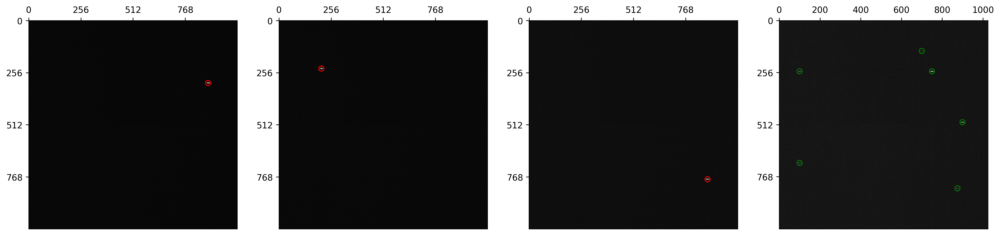

In [24]:
check_RED.apply(core)
affine = dmd.calibrate(verbous = True, blur = 1, circle_size = 2, marker_style = 'o')

### Save current calibration

In [25]:
np.save(("C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\affine_10x_dmd_micropatterning.npy"), affine)

### Load an old calibration

In [23]:
#affine = np.load("C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\affine_20x_2bin_CYAN.npy")
#affine = np.load("C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\affine_20x_2bin_OPTO_STIM.npy")
affine = np.load("C:\\Users\\micro-manager\\Documents\\lhinder\\mm_test_files\\affine_60x_2bin_CYAN.npy")

## Preview the channel settings (takes image where stage is now)
These images will then be used later on so you can preview the segmentation. so best take an image of an actual cell!

### MOVE TO A FOV

fovs = []
for pos_nb, pos in enumerate(position_list):
    treatment = "four_spots"
    fov = FOV(core, pos, treatment, pos_nb,  10, 10)
    fovs.append(fov)
    
    
fov = fovs[2]
#move to new FOV
fov.move_stage_to_fov()

from skimage.draw import polygon

viewer = napari.Viewer()
stack_raw_c0_layer = viewer.add_image(np.zeros((1024,1024)), rgb=False,contrast_limits = (0,2000))
building = np.array([[310, 382], [229, 381], [209, 401], [221, 411]])
shapes_layer = viewer.add_shapes([building], shape_type='polygon', edge_width=5,edge_color='coral', face_color='royalblue')




def polygons_to_array(shapes_layer):
    '''Takes as input a napari shapes layer with polygons, and returns a binary array where polygon areas are 1 and background is 0'''
    img = np.zeros((1024, 1024), dtype=np.uint8)
    shapes = shapes_layer.data
    for shape in shapes:
        r = shape[:,0]
        c = shape[:,1]
        rr, cc = polygon(r, c)
        img[rr, cc] = 1
    return img

manual_stim = polygons_to_array(shapes_layer)
plt.imshow(manual_stim)

In [ ]:
from pathlib import Path
pacman = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'pacman.png'))[:, :, 0]
pacman = (pacman==0)[-1024:,-1024:].astype(np.uint8)
plt.imshow(pacman)
plt.show()
tags = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'tags.png'))[:, :, 0]
tags = (tags==0)[:1024,:1024].astype(np.uint8)
plt.imshow(tags)
plt.show()
labs = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'labs.png'))[:, :, 0]
labs = (labs==0)[-1024:,:1024].astype(np.uint8)
plt.imshow(labs)
plt.show()
snf = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'snf.png'))[:, :, 0]
snf = (snf==0)[-1024:,-1024:].astype(np.uint8)
plt.imshow(snf)
plt.show()
cucumber = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'cucumber.png'))[:, :, 1]
cucumber = (cucumber<255)[:1024,:1024].astype(np.uint8)
plt.imshow(cucumber)
plt.show()
circles = io.imread(Path('Z:/PertzLab/rberthoz/masks/', 'circles.png'))[:, :, 0]
circles = (circles==0)[-1024:,:1024].astype(np.uint8)
plt.imshow(circles)
plt.show()



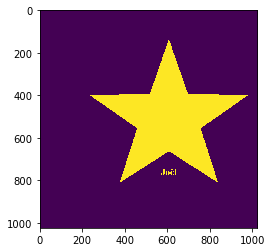

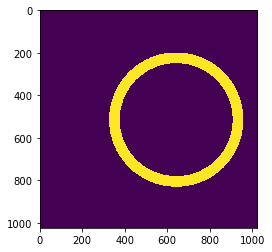

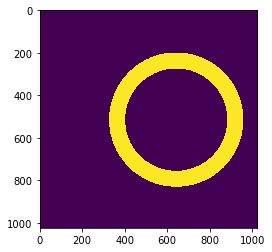

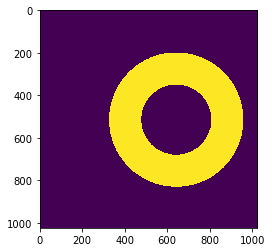

In [34]:
from pathlib import Path
stern = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Stern.png'))[:, :, 0]
stern = (stern==0)[-1024:,:1024].astype(np.uint8)
stern = (stern==0).astype(np.uint8)
plt.imshow(stern)
plt.show()
Donut50 = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Donut 50px.png'))[:, :, 0]
Donut50 = (Donut50==0)[-1024:,:1024].astype(np.uint8)
Donut50 = (Donut50==0).astype(np.uint8)
temp = np.zeros_like(Donut50)
temp[:-50,:] = Donut50[50:,:]
Donut50 = temp
plt.imshow(Donut50)
plt.show()

Donut75 = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Donut 75px.png'))[:, :, 0]
Donut75 = (Donut75==0)[-1024:,:1024].astype(np.uint8)
Donut75 = (Donut75==0).astype(np.uint8)
temp = np.zeros_like(Donut50)
temp[:-50,:] = Donut75[50:,:]
Donut75 = temp
plt.imshow(Donut75)
plt.show()

Donut100 = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Donut 100px.png'))[:, :, 0]
Donut100 = (Donut100==0)[-1024:,:1024].astype(np.uint8)
Donut100 = (Donut100==0).astype(np.uint8)

temp = np.zeros_like(Donut50)
temp[:-50,:] = Donut100[50:,:]
Donut100 = temp


plt.imshow(Donut100)
plt.show()


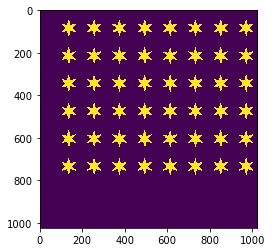

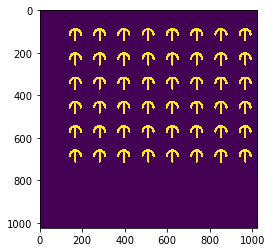

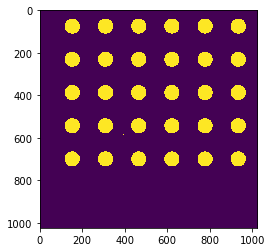

In [26]:
from pathlib import Path
stern = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Stars20x.png'))[:, :, 0]
stern = (stern==0)[-1024:,:1024].astype(np.uint8)
stern = (stern==0).astype(np.uint8)
temp = np.zeros_like(stern)
temp[:-50,:] = stern[50:,:]
stern = temp
plt.imshow(stern)
plt.show()

Anchor = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Anchor20x.png'))[:, :, 0]
Anchor = (Anchor==0)[-1024:,:1024].astype(np.uint8)
Anchor = (Anchor==0).astype(np.uint8)
temp = np.zeros_like(Anchor)
temp[:-50,:] = Anchor[50:,:]
Anchor = temp
plt.imshow(Anchor)
plt.show()

Circle = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Circle20x.png'))[:, :, 0]
Circle = (Circle==0)[-1024:,:1024].astype(np.uint8)
Circle = (Circle==0).astype(np.uint8)
temp = np.zeros_like(Circle)
temp[:-50,:] = Circle[50:,:]
Circle = temp
plt.imshow(Circle)
plt.show()


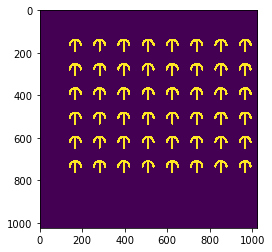

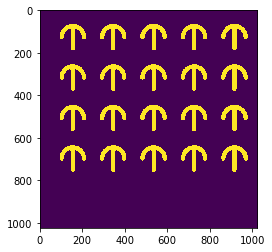

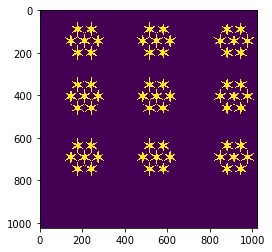

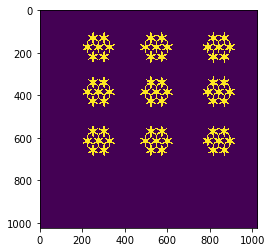

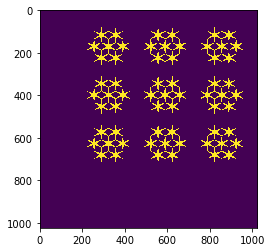

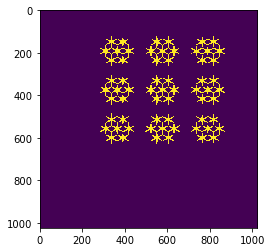

In [24]:
from pathlib import Path
Anchor_20x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Anchor20x.png'))[:, :, 0]
Anchor_20x = (Anchor_20x==0)[-1024:,:1024].astype(np.uint8)
Anchor_20x = (Anchor_20x==0).astype(np.uint8)
plt.imshow(Anchor_20x)
plt.show()

Anchor_40x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Anchor40x.png'))[:, :, 0]
Anchor_40x = (Anchor_40x==0)[-1024:,:1024].astype(np.uint8)
Anchor_40x = (Anchor_40x==0).astype(np.uint8)
temp = np.zeros_like(Anchor_40x)
temp[:-50,:] = Anchor_40x[50:,:]
Anchor_40x = temp
plt.imshow(Anchor_40x)
plt.show()

Hexa_Star20x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Hexa_Star20x.png'))[:, :, 0]
Hexa_Star20x = (Hexa_Star20x==0)[-1024:,:1024].astype(np.uint8)
Hexa_Star20x = (Hexa_Star20x==0).astype(np.uint8)
temp = np.zeros_like(Hexa_Star20x)
temp[:-50,:] = Hexa_Star20x[50:,:]
Hexa_Star20x = temp
plt.imshow(Hexa_Star20x)
plt.show()

Hexa_Starsmall20x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Hexa_Starsmall20x.png'))[:, :, 0]
Hexa_Starsmall20x = (Hexa_Starsmall20x==0)[-1024:,:1024].astype(np.uint8)
Hexa_Starsmall20x = (Hexa_Starsmall20x==0).astype(np.uint8)

temp = np.zeros_like(Hexa_Starsmall20x)
temp[:-50,:] = Hexa_Starsmall20x[50:,:]
Hexa_Starsmall20x = temp
plt.imshow(Hexa_Starsmall20x)
plt.show()


Hexa_Starthin20x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Hexa_Starthin20x.png'))[:, :, 0]
Hexa_Starthin20x = (Hexa_Starthin20x==0)[-1024:,:1024].astype(np.uint8)
Hexa_Starthin20x = (Hexa_Starthin20x==0).astype(np.uint8)

temp = np.zeros_like(Hexa_Starthin20x)
temp[:-50,:] = Hexa_Starthin20x[50:,:]
Hexa_Starthin20x = temp


plt.imshow(Hexa_Starthin20x)
plt.show()

Hexa_Starthinsmall20x = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Hexa_Starthinsmall20x.png'))[:, :, 0]
Hexa_Starthinsmall20x = (Hexa_Starthinsmall20x==0)[-1024:,:1024].astype(np.uint8)
Hexa_Starthinsmall20x = (Hexa_Starthinsmall20x==0).astype(np.uint8)

temp = np.zeros_like(Hexa_Starthinsmall20x)
temp[:-50,:] = Hexa_Starthinsmall20x[50:,:]
Hexa_Starthinsmall20x = temp


plt.imshow(Hexa_Starthinsmall20x)
plt.show()

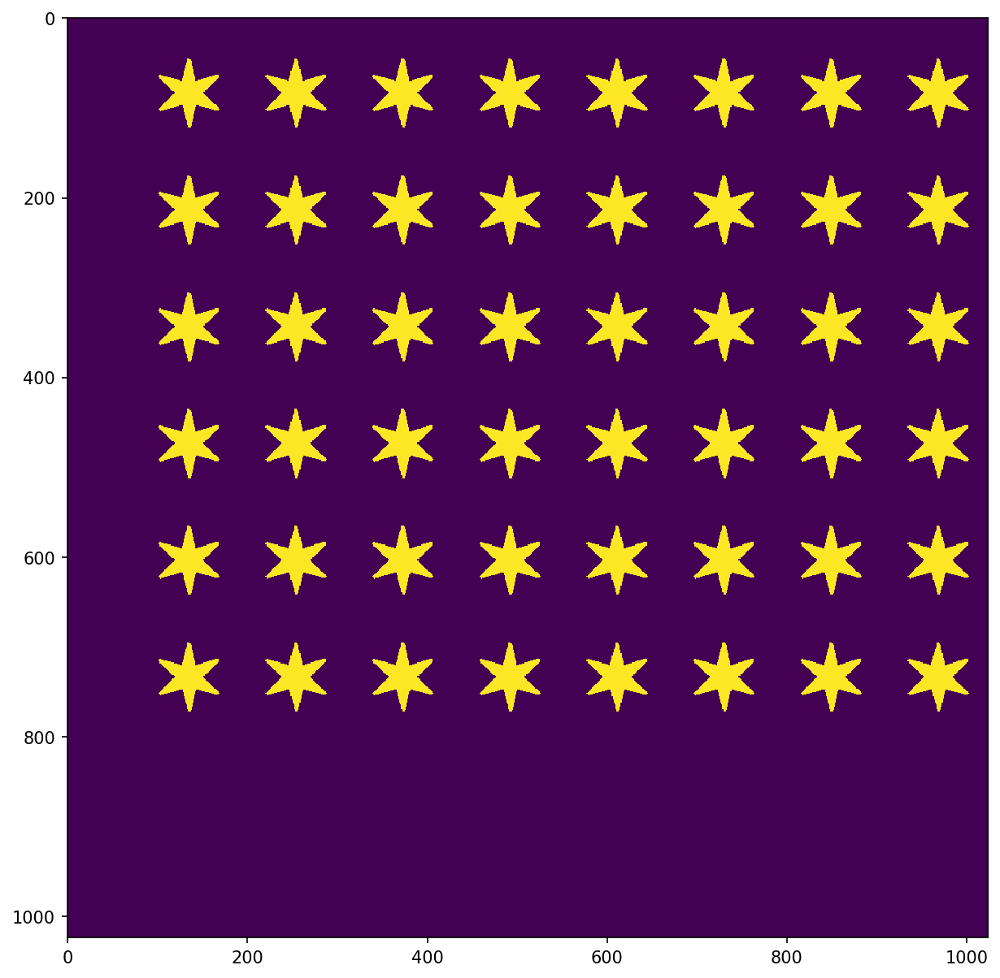

In [39]:
from pathlib import Path
lines = io.imread(Path('Z:/jfrei/Micropatterning/Patterns/', 'Stars10x_NIH3T3.png'))[:, :, 0]
lines = (lines==0)[-1024:,:1024].astype(np.uint8)
lines = (lines==0).astype(np.uint8)
temp = np.zeros_like(lines)
temp[:-50,:] = lines[50:,:]
lines = temp
plt.figure(figsize = (10,10),dpi = 150)
plt.imshow(lines)
plt.show()

In [87]:
empty = np.zeros_like(stern)

In [89]:
type(empty[0,0])

numpy.uint8

In [ ]:
def load_mask(name,invert = False):
    mask = io.imread(Path('Z:/PertzLab/rberthoz/masks/', f'{name}.png'))[:, :, 0]
    if (invert):
        mask = ~mask
    mask = (mask==0)[-1024:,-1024:].astype(np.uint8)
    plt.imshow(mask)
    plt.show()
    return mask


lines = load_mask('lines_10u_50u_at_10x_cropped', invert = True)
connected_circles = load_mask('2_connected_circles')
circle = load_mask('1_circle', invert = True)
circles_assorted = load_mask('weird_circles', invert = True)
anchor = load_mask('anchor', invert = True)
dmd_fov = load_mask('dmd_FOV_margin_20x_UV', invert = True)
anchor_20x = load_mask('cytoo_A_20x', invert = True)

## Check in Red for Pattern

For UV exposure: `expose_UV` instead of check_RED
set exposure time:
        ```python
        exposure_time = 125
        expose_UV.camera_exposure_time = int(exposure_time)
        ```

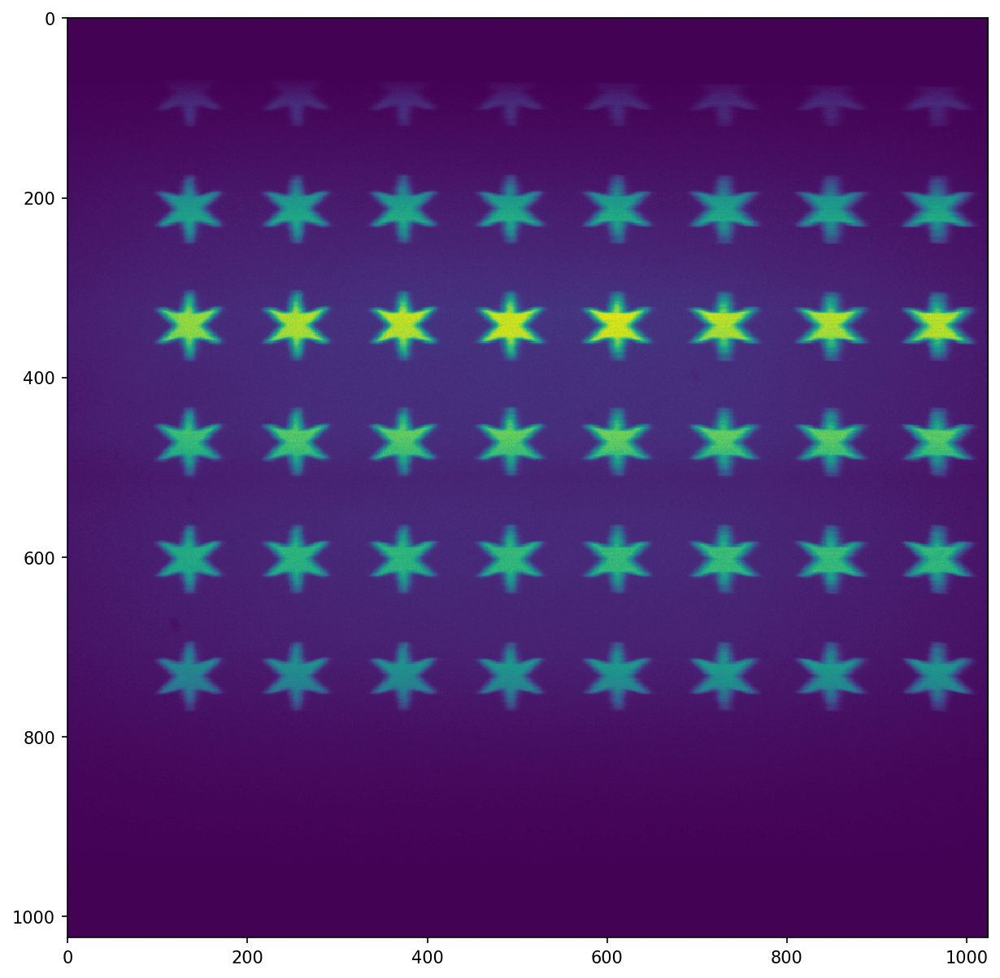

In [81]:
stim_img = acq_stim(lines,check_RED,affine,dmd)
plt.figure(figsize = (10,10),dpi = 150)
plt.imshow(stim_img)

In [48]:
masks = [Hexa_Starthinsmall20x, Anchor_20x, Hexa_Starthin20x]

In [41]:
masks = [Hexa_Star20x,Hexa_Starsmall20x,Hexa_Starthin20x]

In [35]:
masks = [Donut50, Circle40x, Donut100]

In [32]:
masks = [Anchor_40x, Anchor_40x, Anchor_40x]

In [27]:
masks = [Anchor, stern, Circle]

In [82]:
masks = [lines]

In [ ]:
dmd

## Train the pixel clf (only needed if you use the pixel classifier instead of the thresholding)

save classifier 

## Simple timelapse with manual stimulation


In [83]:
### Settings for pipeline REAL MODE ###
test_mode = False   #leave this
time_between_frames = 5 ## HOW MANY SECONDS IN BETWEEN FRAMES?
nb_time_steps = 150       ## HOW MANY FRAMES IN TOTAL PER FOV? change here
norm_min = 5        #leave this
norm_max = 95       #leave this
table_old = None    #leave this
stim_frame = False  #leave this
search_range = 15   #leave this
memory = 3          #leave this
np.random.seed(6)   #leave this
width = 4 ## Stimulation width 
lbl_cmap = random_label_cmap() #leave this 
output_path = 'Z:\\jfrei\\Micropatterning\\Pipeline\\exp_032\\'

## Create the required folders 
required_folders = ['light_mask','raw','mask','stim','tracks','opto_check','spot_table'] #leave this
create_folders(output_path,required_folders)  #leave this

Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\light_mask already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\raw already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\mask already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\stim already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\tracks already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\opto_check already exists
Directory Z:\jfrei\Micropatterning\Pipeline\exp_032\spot_table already exists


In [34]:
from tqdm import tqdm

In [85]:
exposure_time = 150

In [94]:
exposure_times = [10,10,15]
masks = [Anchor, empty, Anchor]

NameError: name 'pattern' is not defined

1

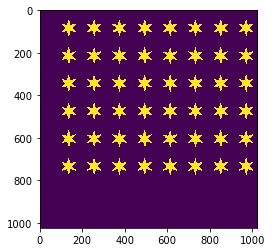

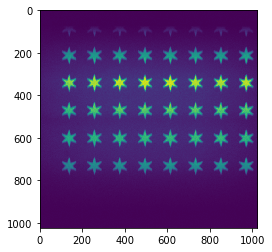

  0%|                                                                                          | 0/192 [00:00<?, ?it/s]

FOV: 0, exposure_time: 150


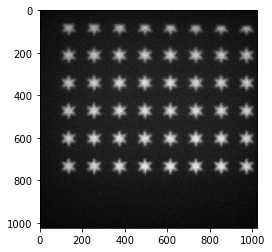

  1%|▍                                                                                 | 1/192 [00:02<08:36,  2.71s/it]

FOV: 1, exposure_time: 150


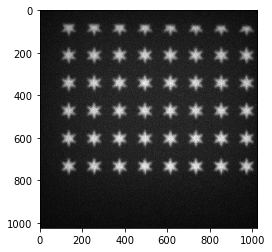

  1%|▊                                                                                 | 2/192 [00:04<06:16,  1.98s/it]

FOV: 2, exposure_time: 150


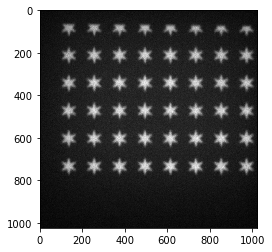

  2%|█▎                                                                                | 3/192 [00:05<05:10,  1.64s/it]

FOV: 3, exposure_time: 150


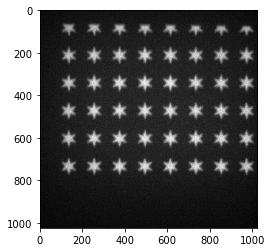

  2%|█▋                                                                                | 4/192 [00:06<04:54,  1.57s/it]

FOV: 4, exposure_time: 150


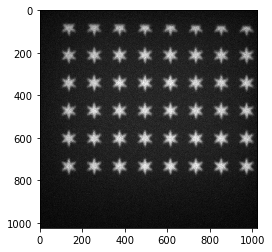

  3%|██▏                                                                               | 5/192 [00:08<04:54,  1.58s/it]

FOV: 5, exposure_time: 150


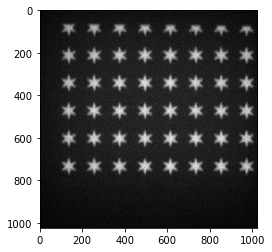

  3%|██▌                                                                               | 6/192 [00:09<04:42,  1.52s/it]

FOV: 6, exposure_time: 150


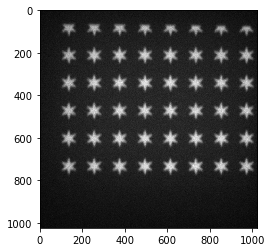

  4%|██▉                                                                               | 7/192 [00:11<04:40,  1.52s/it]

FOV: 7, exposure_time: 150


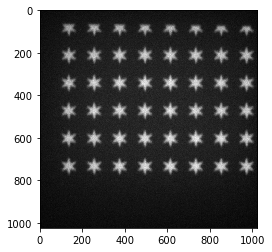

  4%|███▍                                                                              | 8/192 [00:12<04:30,  1.47s/it]

FOV: 8, exposure_time: 150


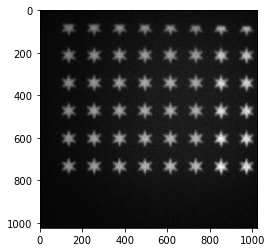

  5%|███▊                                                                              | 9/192 [00:14<04:33,  1.49s/it]

FOV: 9, exposure_time: 150


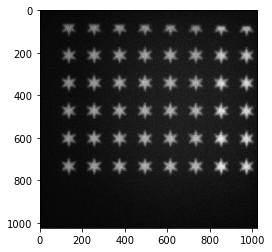

  5%|████▏                                                                            | 10/192 [00:15<04:15,  1.41s/it]

FOV: 10, exposure_time: 150


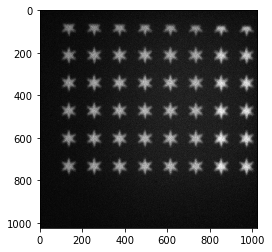

  6%|████▋                                                                            | 11/192 [00:16<04:05,  1.36s/it]

FOV: 11, exposure_time: 150


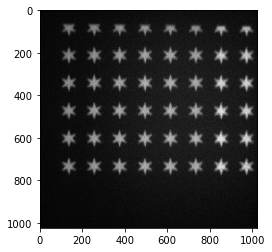

  6%|█████                                                                            | 12/192 [00:18<04:13,  1.41s/it]

FOV: 12, exposure_time: 150


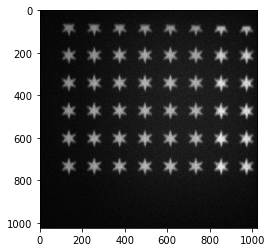

  7%|█████▍                                                                           | 13/192 [00:19<04:21,  1.46s/it]

FOV: 13, exposure_time: 150


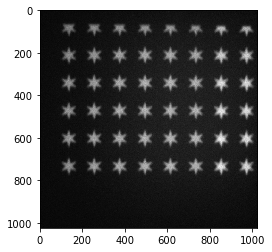

  7%|█████▉                                                                           | 14/192 [00:21<04:24,  1.48s/it]

FOV: 14, exposure_time: 150


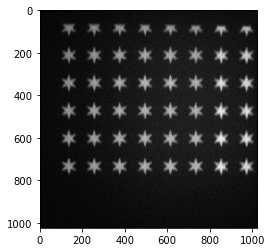

  8%|██████▎                                                                          | 15/192 [00:22<04:25,  1.50s/it]

FOV: 15, exposure_time: 150


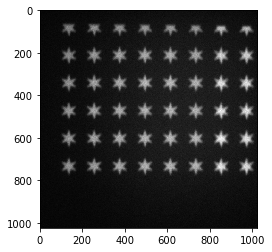

  8%|██████▊                                                                          | 16/192 [00:24<04:19,  1.48s/it]

FOV: 16, exposure_time: 150


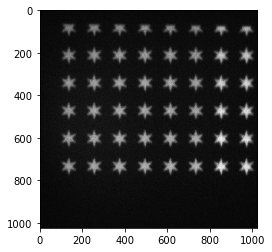

  9%|███████▏                                                                         | 17/192 [00:25<04:20,  1.49s/it]

FOV: 17, exposure_time: 150


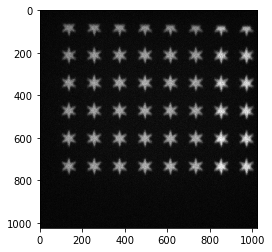

  9%|███████▌                                                                         | 18/192 [00:27<04:19,  1.49s/it]

FOV: 18, exposure_time: 150


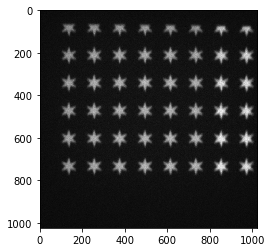

 10%|████████                                                                         | 19/192 [00:28<04:21,  1.51s/it]

FOV: 19, exposure_time: 150


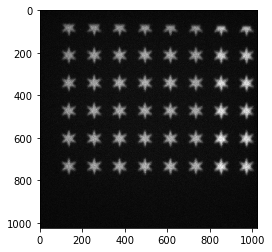

 10%|████████▍                                                                        | 20/192 [00:30<04:19,  1.51s/it]

FOV: 20, exposure_time: 150


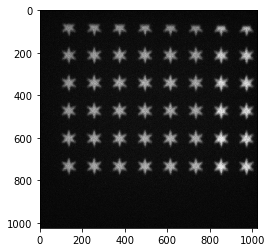

 11%|████████▊                                                                        | 21/192 [00:31<04:04,  1.43s/it]

FOV: 21, exposure_time: 150


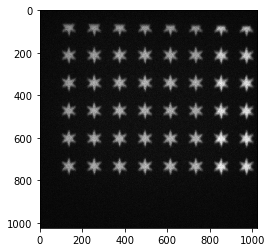

 11%|█████████▎                                                                       | 22/192 [00:32<03:52,  1.37s/it]

FOV: 22, exposure_time: 150


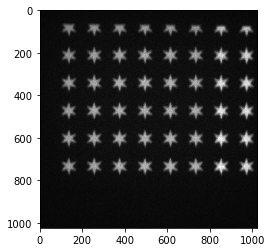

 12%|█████████▋                                                                       | 23/192 [00:34<03:54,  1.39s/it]

FOV: 23, exposure_time: 150


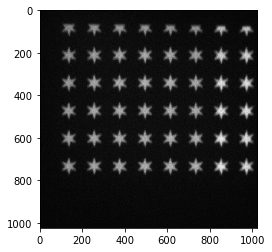

 12%|██████████▏                                                                      | 24/192 [00:36<04:11,  1.50s/it]

FOV: 24, exposure_time: 150


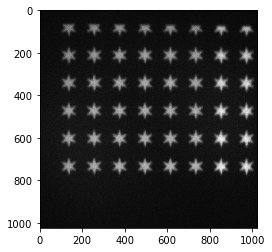

 13%|██████████▌                                                                      | 25/192 [00:37<04:18,  1.55s/it]

FOV: 25, exposure_time: 150


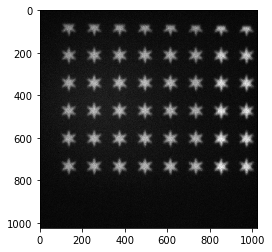

 14%|██████████▉                                                                      | 26/192 [00:39<04:12,  1.52s/it]

FOV: 26, exposure_time: 150


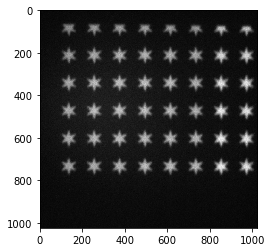

 14%|███████████▍                                                                     | 27/192 [00:40<04:11,  1.53s/it]

FOV: 27, exposure_time: 150


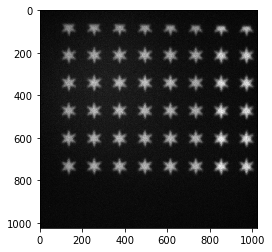

 15%|███████████▊                                                                     | 28/192 [00:42<04:07,  1.51s/it]

FOV: 28, exposure_time: 150


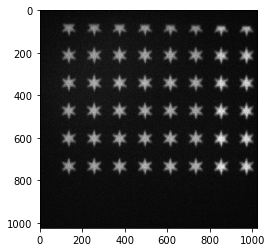

 15%|████████████▏                                                                    | 29/192 [00:43<04:06,  1.51s/it]

FOV: 29, exposure_time: 150


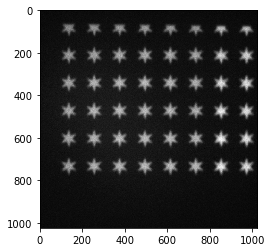

 16%|████████████▋                                                                    | 30/192 [00:45<04:01,  1.49s/it]

FOV: 30, exposure_time: 150


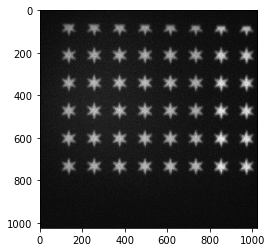

 16%|█████████████                                                                    | 31/192 [00:46<03:50,  1.43s/it]

FOV: 31, exposure_time: 150


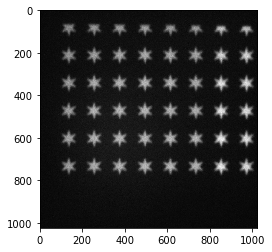

 17%|█████████████▌                                                                   | 32/192 [00:47<03:48,  1.43s/it]

FOV: 32, exposure_time: 150


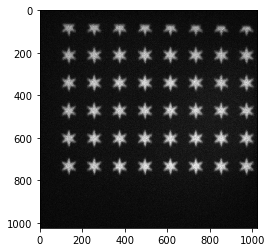

 17%|█████████████▉                                                                   | 33/192 [00:49<03:52,  1.46s/it]

FOV: 33, exposure_time: 150


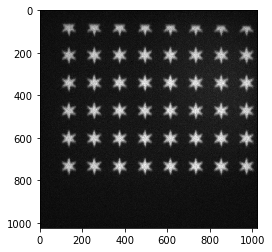

 18%|██████████████▎                                                                  | 34/192 [00:50<03:51,  1.46s/it]

FOV: 34, exposure_time: 150


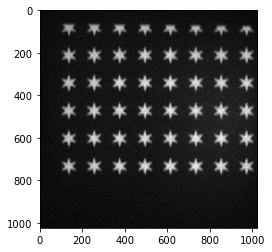

 18%|██████████████▊                                                                  | 35/192 [00:52<03:48,  1.46s/it]

FOV: 35, exposure_time: 150


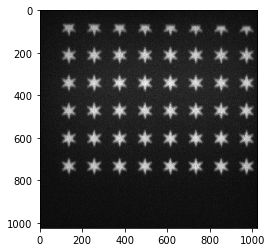

 19%|███████████████▏                                                                 | 36/192 [00:53<03:50,  1.48s/it]

FOV: 36, exposure_time: 150


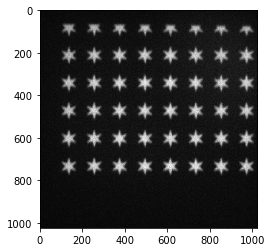

 19%|███████████████▌                                                                 | 37/192 [00:55<03:49,  1.48s/it]

FOV: 37, exposure_time: 150


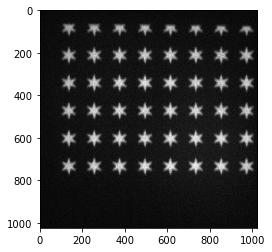

 20%|████████████████                                                                 | 38/192 [00:56<03:49,  1.49s/it]

FOV: 38, exposure_time: 150


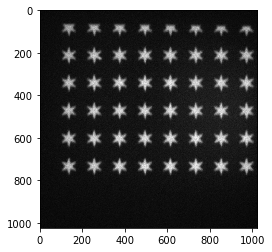

 20%|████████████████▍                                                                | 39/192 [00:58<03:48,  1.50s/it]

FOV: 39, exposure_time: 150


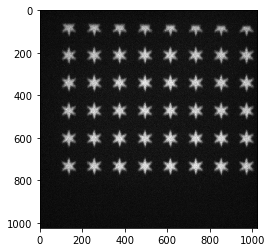

 21%|████████████████▉                                                                | 40/192 [00:59<03:36,  1.43s/it]

FOV: 40, exposure_time: 150


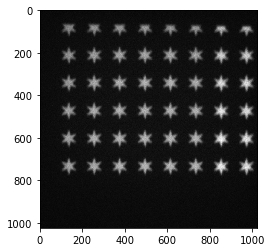

 21%|█████████████████▎                                                               | 41/192 [01:01<03:52,  1.54s/it]

FOV: 41, exposure_time: 150


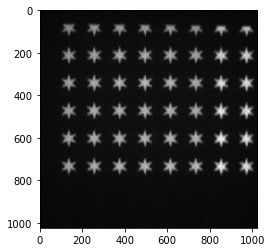

 22%|█████████████████▋                                                               | 42/192 [01:02<03:45,  1.51s/it]

FOV: 42, exposure_time: 150


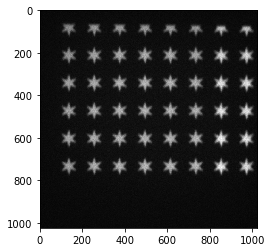

 22%|██████████████████▏                                                              | 43/192 [01:04<03:43,  1.50s/it]

FOV: 43, exposure_time: 150


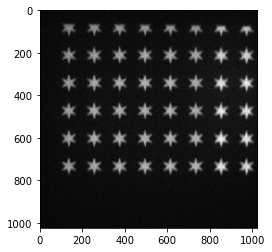

 23%|██████████████████▌                                                              | 44/192 [01:05<03:38,  1.48s/it]

FOV: 44, exposure_time: 150


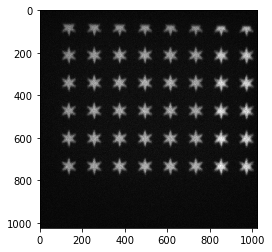

 23%|██████████████████▉                                                              | 45/192 [01:07<03:42,  1.51s/it]

FOV: 45, exposure_time: 150


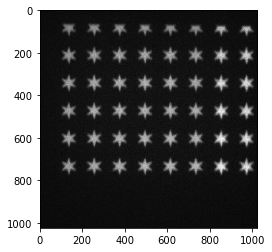

 24%|███████████████████▍                                                             | 46/192 [01:08<03:38,  1.50s/it]

FOV: 46, exposure_time: 150


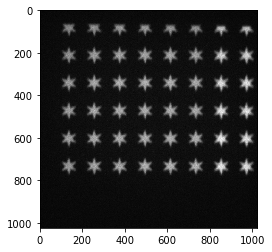

 24%|███████████████████▊                                                             | 47/192 [01:10<03:39,  1.51s/it]

FOV: 47, exposure_time: 150


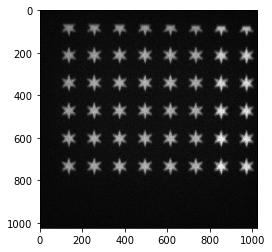

 25%|████████████████████▎                                                            | 48/192 [01:11<03:35,  1.49s/it]

FOV: 48, exposure_time: 150


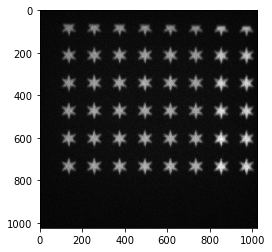

 26%|████████████████████▋                                                            | 49/192 [01:13<03:35,  1.51s/it]

FOV: 49, exposure_time: 150


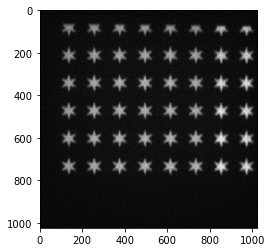

 26%|█████████████████████                                                            | 50/192 [01:14<03:31,  1.49s/it]

FOV: 50, exposure_time: 150


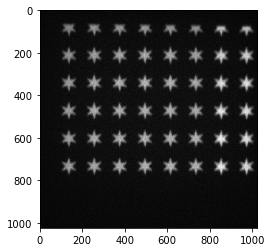

 27%|█████████████████████▌                                                           | 51/192 [01:16<03:27,  1.47s/it]

FOV: 51, exposure_time: 150


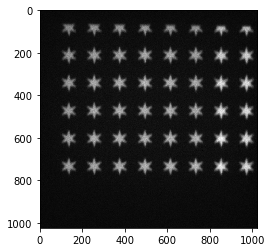

 27%|█████████████████████▉                                                           | 52/192 [01:17<03:15,  1.40s/it]

FOV: 52, exposure_time: 150


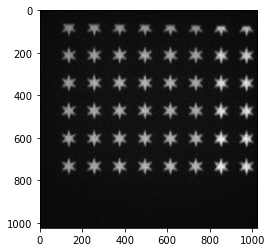

 28%|██████████████████████▎                                                          | 53/192 [01:18<03:09,  1.36s/it]

FOV: 53, exposure_time: 150


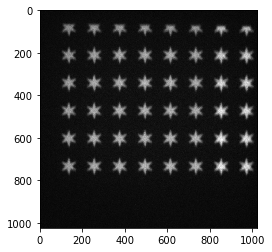

 28%|██████████████████████▊                                                          | 54/192 [01:20<03:14,  1.41s/it]

FOV: 54, exposure_time: 150


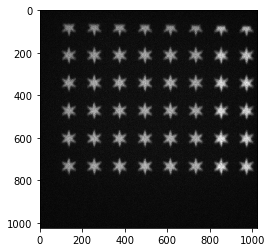

 29%|███████████████████████▏                                                         | 55/192 [01:21<03:17,  1.44s/it]

FOV: 55, exposure_time: 150


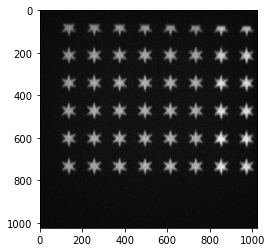

 29%|███████████████████████▋                                                         | 56/192 [01:23<03:15,  1.44s/it]

FOV: 56, exposure_time: 150


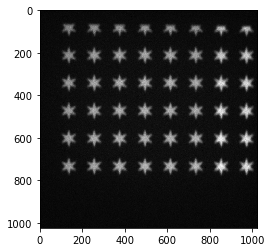

 30%|████████████████████████                                                         | 57/192 [01:24<03:25,  1.52s/it]

FOV: 57, exposure_time: 150


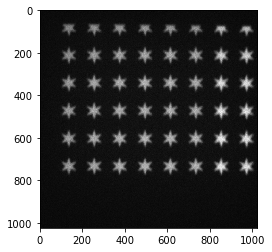

 30%|████████████████████████▍                                                        | 58/192 [01:26<03:17,  1.47s/it]

FOV: 58, exposure_time: 150


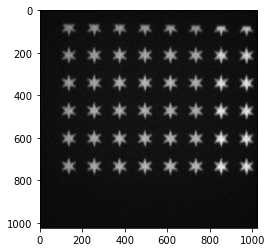

 31%|████████████████████████▉                                                        | 59/192 [01:27<03:19,  1.50s/it]

FOV: 59, exposure_time: 150


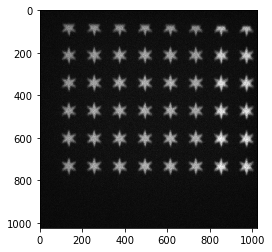

 31%|█████████████████████████▎                                                       | 60/192 [01:29<03:19,  1.51s/it]

FOV: 60, exposure_time: 150


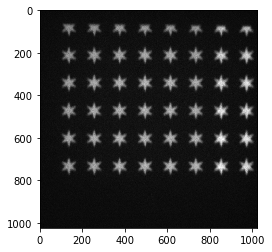

 32%|█████████████████████████▋                                                       | 61/192 [01:30<03:17,  1.51s/it]

FOV: 61, exposure_time: 150


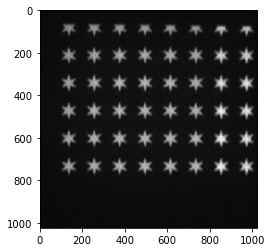

 32%|██████████████████████████▏                                                      | 62/192 [01:32<03:11,  1.48s/it]

FOV: 62, exposure_time: 150


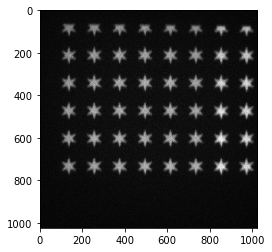

 33%|██████████████████████████▌                                                      | 63/192 [01:33<03:12,  1.49s/it]

FOV: 63, exposure_time: 150


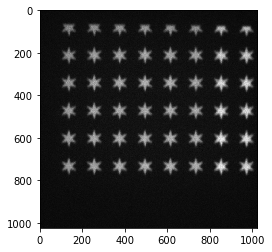

 33%|███████████████████████████                                                      | 64/192 [01:35<03:08,  1.47s/it]

FOV: 64, exposure_time: 150


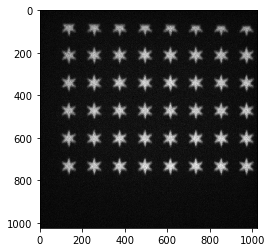

 34%|███████████████████████████▍                                                     | 65/192 [01:36<03:08,  1.48s/it]

FOV: 65, exposure_time: 150


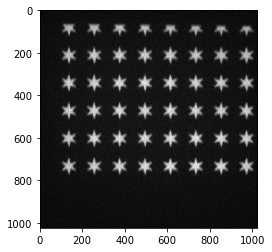

 34%|███████████████████████████▊                                                     | 66/192 [01:38<03:08,  1.50s/it]

FOV: 66, exposure_time: 150


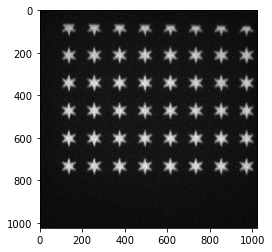

 35%|████████████████████████████▎                                                    | 67/192 [01:39<03:08,  1.51s/it]

FOV: 67, exposure_time: 150


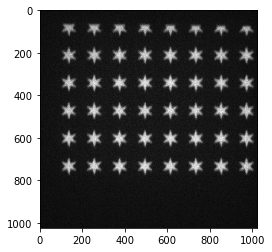

 35%|████████████████████████████▋                                                    | 68/192 [01:41<03:07,  1.51s/it]

FOV: 68, exposure_time: 150


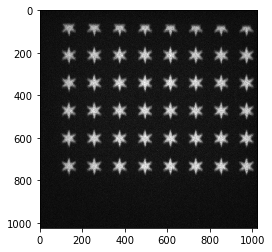

 36%|█████████████████████████████                                                    | 69/192 [01:42<03:05,  1.51s/it]

FOV: 69, exposure_time: 150


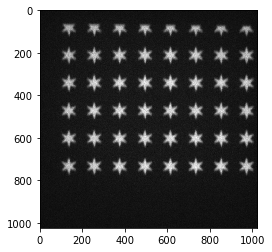

 36%|█████████████████████████████▌                                                   | 70/192 [01:44<03:01,  1.49s/it]

FOV: 70, exposure_time: 150


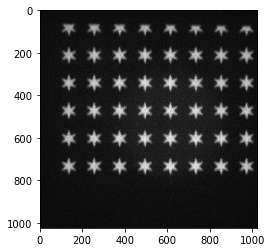

 37%|█████████████████████████████▉                                                   | 71/192 [01:45<02:57,  1.47s/it]

FOV: 71, exposure_time: 150


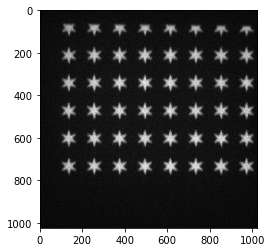

 38%|██████████████████████████████▍                                                  | 72/192 [01:46<02:49,  1.41s/it]

FOV: 72, exposure_time: 150


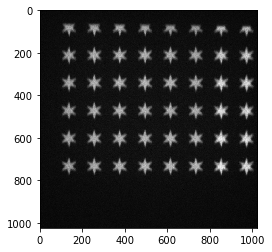

 38%|██████████████████████████████▊                                                  | 73/192 [01:48<02:51,  1.44s/it]

FOV: 73, exposure_time: 150


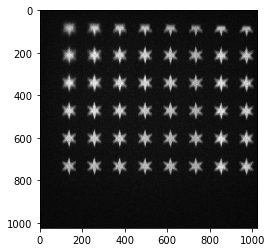

 39%|███████████████████████████████▏                                                 | 74/192 [01:49<02:48,  1.43s/it]

FOV: 74, exposure_time: 150


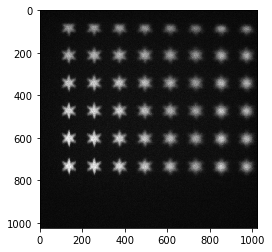

 39%|███████████████████████████████▋                                                 | 75/192 [01:51<02:50,  1.46s/it]

FOV: 75, exposure_time: 150


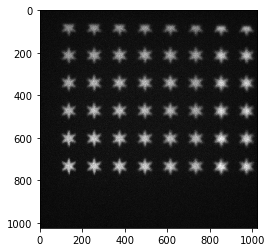

 40%|████████████████████████████████                                                 | 76/192 [01:53<02:56,  1.53s/it]

FOV: 76, exposure_time: 150


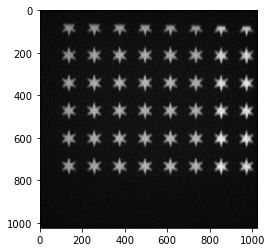

 40%|████████████████████████████████▍                                                | 77/192 [01:54<02:56,  1.53s/it]

FOV: 77, exposure_time: 150


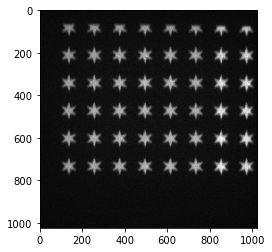

 41%|████████████████████████████████▉                                                | 78/192 [01:55<02:43,  1.43s/it]

FOV: 78, exposure_time: 150


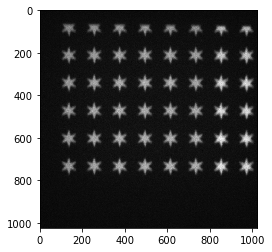

 41%|█████████████████████████████████▎                                               | 79/192 [01:57<02:46,  1.47s/it]

FOV: 79, exposure_time: 150


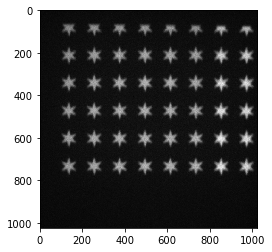

 42%|█████████████████████████████████▊                                               | 80/192 [01:58<02:43,  1.46s/it]

FOV: 80, exposure_time: 150


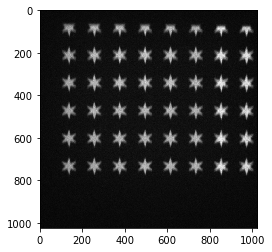

 42%|██████████████████████████████████▏                                              | 81/192 [02:00<02:41,  1.46s/it]

FOV: 81, exposure_time: 150


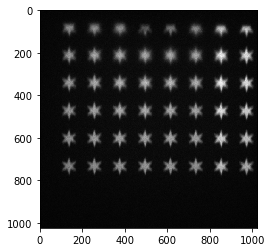

 43%|██████████████████████████████████▌                                              | 82/192 [02:01<02:38,  1.44s/it]

FOV: 82, exposure_time: 150


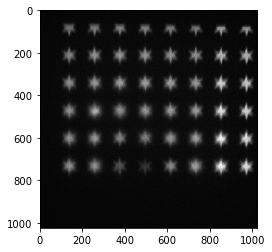

 43%|███████████████████████████████████                                              | 83/192 [02:03<02:36,  1.43s/it]

FOV: 83, exposure_time: 150


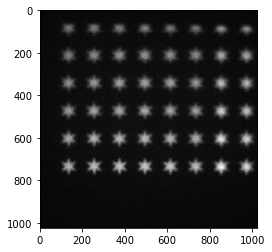

 44%|███████████████████████████████████▍                                             | 84/192 [02:04<02:39,  1.48s/it]

FOV: 84, exposure_time: 150


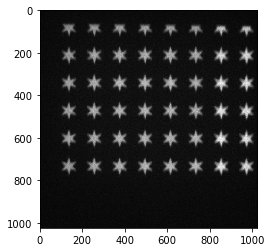

 44%|███████████████████████████████████▊                                             | 85/192 [02:06<02:41,  1.51s/it]

FOV: 85, exposure_time: 150


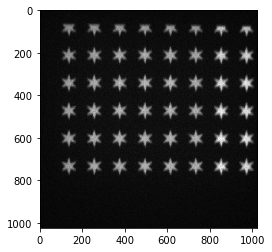

 45%|████████████████████████████████████▎                                            | 86/192 [02:07<02:37,  1.49s/it]

FOV: 86, exposure_time: 150


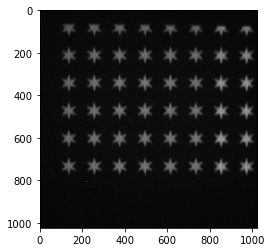

 45%|████████████████████████████████████▋                                            | 87/192 [02:08<02:27,  1.40s/it]

FOV: 87, exposure_time: 150


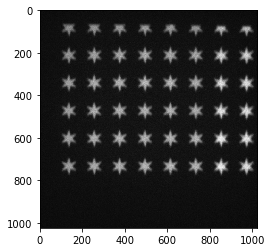

 46%|█████████████████████████████████████▏                                           | 88/192 [02:10<02:21,  1.36s/it]

FOV: 88, exposure_time: 150


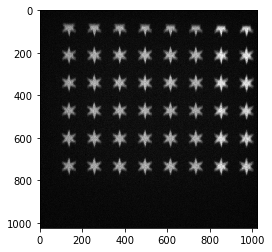

 46%|█████████████████████████████████████▌                                           | 89/192 [02:11<02:25,  1.41s/it]

FOV: 89, exposure_time: 150


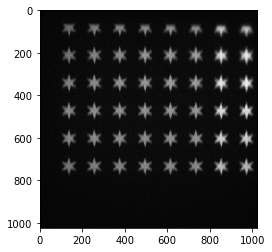

 47%|█████████████████████████████████████▉                                           | 90/192 [02:12<02:18,  1.36s/it]

FOV: 90, exposure_time: 150


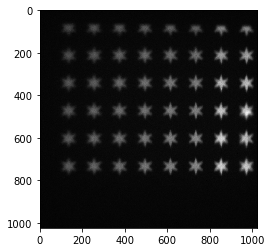

 47%|██████████████████████████████████████▍                                          | 91/192 [02:14<02:28,  1.47s/it]

FOV: 91, exposure_time: 150


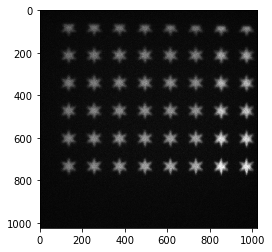

 48%|██████████████████████████████████████▊                                          | 92/192 [02:16<02:30,  1.50s/it]

FOV: 92, exposure_time: 150


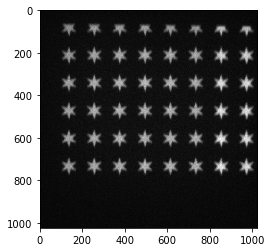

 48%|███████████████████████████████████████▏                                         | 93/192 [02:17<02:31,  1.53s/it]

FOV: 93, exposure_time: 150


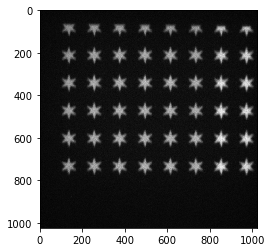

 49%|███████████████████████████████████████▋                                         | 94/192 [02:19<02:29,  1.53s/it]

FOV: 94, exposure_time: 150


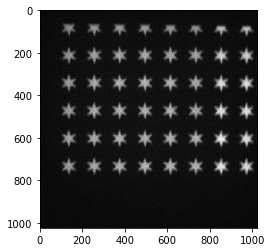

 49%|████████████████████████████████████████                                         | 95/192 [02:20<02:28,  1.53s/it]

FOV: 95, exposure_time: 150


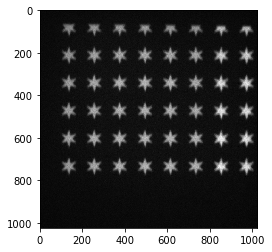

 50%|████████████████████████████████████████▌                                        | 96/192 [02:22<02:24,  1.50s/it]

FOV: 96, exposure_time: 150


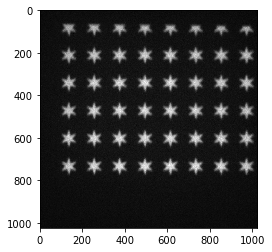

 51%|████████████████████████████████████████▉                                        | 97/192 [02:24<02:33,  1.61s/it]

FOV: 97, exposure_time: 150


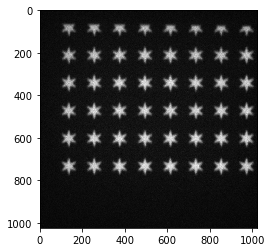

 51%|█████████████████████████████████████████▎                                       | 98/192 [02:25<02:26,  1.56s/it]

FOV: 98, exposure_time: 150


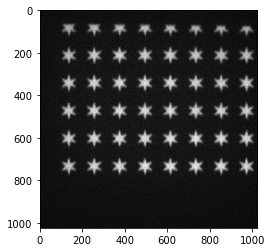

 52%|█████████████████████████████████████████▊                                       | 99/192 [02:26<02:15,  1.46s/it]

FOV: 99, exposure_time: 150


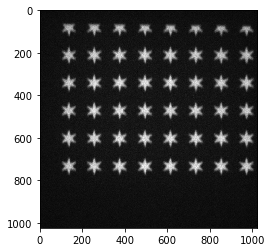

 52%|█████████████████████████████████████████▋                                      | 100/192 [02:28<02:16,  1.48s/it]

FOV: 100, exposure_time: 150


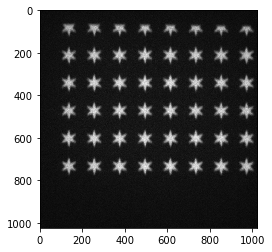

 53%|██████████████████████████████████████████                                      | 101/192 [02:29<02:15,  1.49s/it]

FOV: 101, exposure_time: 150


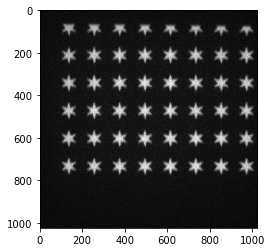

 53%|██████████████████████████████████████████▌                                     | 102/192 [02:31<02:11,  1.46s/it]

FOV: 102, exposure_time: 150


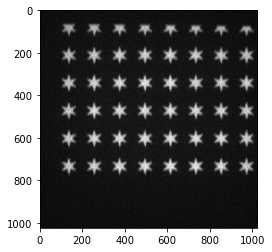

 54%|██████████████████████████████████████████▉                                     | 103/192 [02:32<02:09,  1.46s/it]

FOV: 103, exposure_time: 150


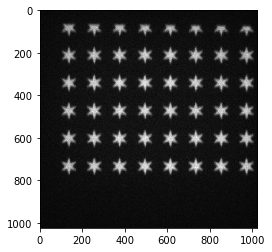

 54%|███████████████████████████████████████████▎                                    | 104/192 [02:34<02:09,  1.48s/it]

FOV: 104, exposure_time: 150


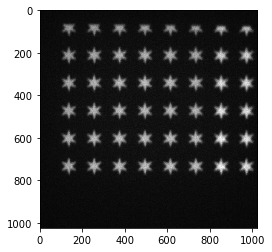

 55%|███████████████████████████████████████████▊                                    | 105/192 [02:36<02:20,  1.62s/it]

FOV: 105, exposure_time: 150


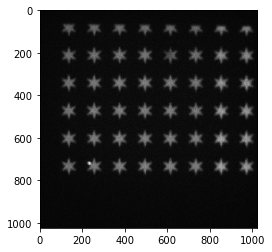

 55%|████████████████████████████████████████████▏                                   | 106/192 [02:37<02:11,  1.53s/it]

FOV: 106, exposure_time: 150


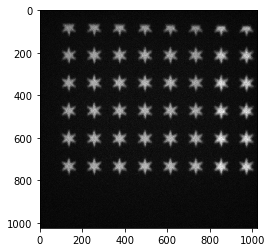

 56%|████████████████████████████████████████████▌                                   | 107/192 [02:39<02:14,  1.59s/it]

FOV: 107, exposure_time: 150


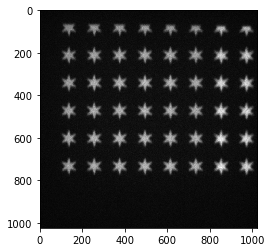

 56%|█████████████████████████████████████████████                                   | 108/192 [02:40<02:08,  1.54s/it]

FOV: 108, exposure_time: 150


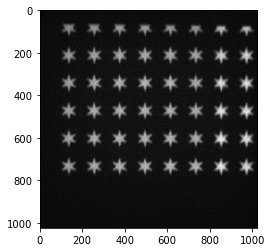

 57%|█████████████████████████████████████████████▍                                  | 109/192 [02:41<02:00,  1.45s/it]

FOV: 109, exposure_time: 150


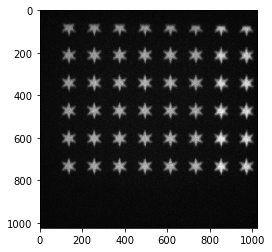

 57%|█████████████████████████████████████████████▊                                  | 110/192 [02:43<02:08,  1.57s/it]

FOV: 110, exposure_time: 150


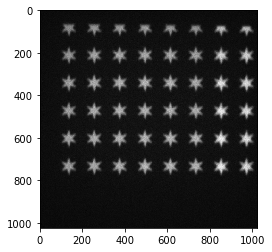

 58%|██████████████████████████████████████████████▎                                 | 111/192 [02:45<02:06,  1.56s/it]

FOV: 111, exposure_time: 150


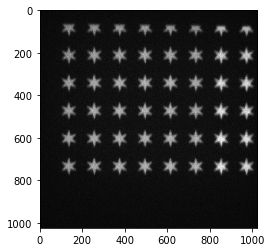

 58%|██████████████████████████████████████████████▋                                 | 112/192 [02:46<02:01,  1.52s/it]

FOV: 112, exposure_time: 150


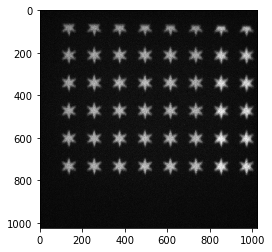

 59%|███████████████████████████████████████████████                                 | 113/192 [02:48<02:00,  1.52s/it]

FOV: 113, exposure_time: 150


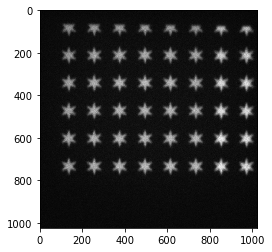

 59%|███████████████████████████████████████████████▌                                | 114/192 [02:49<01:56,  1.50s/it]

FOV: 114, exposure_time: 150


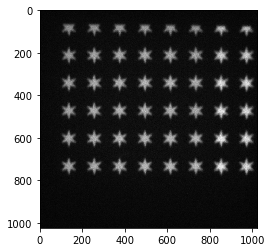

 60%|███████████████████████████████████████████████▉                                | 115/192 [02:50<01:48,  1.41s/it]

FOV: 115, exposure_time: 150


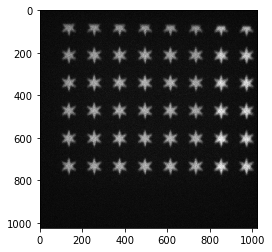

 60%|████████████████████████████████████████████████▎                               | 116/192 [02:52<01:48,  1.43s/it]

FOV: 116, exposure_time: 150


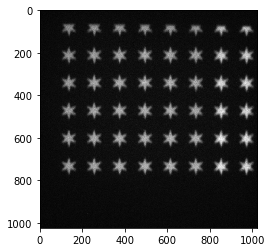

 61%|████████████████████████████████████████████████▊                               | 117/192 [02:53<01:48,  1.44s/it]

FOV: 117, exposure_time: 150


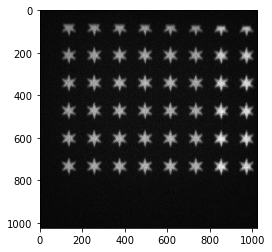

 61%|█████████████████████████████████████████████████▏                              | 118/192 [02:55<01:46,  1.44s/it]

FOV: 118, exposure_time: 150


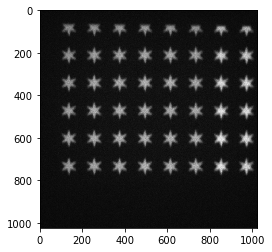

 62%|█████████████████████████████████████████████████▌                              | 119/192 [02:56<01:47,  1.47s/it]

FOV: 119, exposure_time: 150


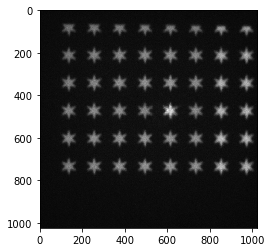

 62%|██████████████████████████████████████████████████                              | 120/192 [02:58<01:47,  1.49s/it]

FOV: 120, exposure_time: 150


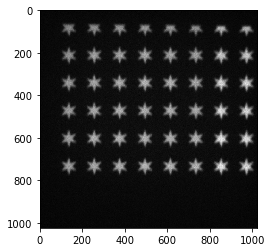

 63%|██████████████████████████████████████████████████▍                             | 121/192 [02:59<01:47,  1.51s/it]

FOV: 121, exposure_time: 150


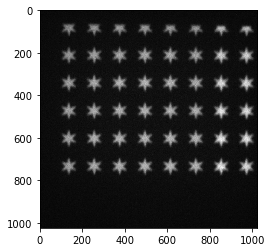

 64%|██████████████████████████████████████████████████▊                             | 122/192 [03:01<01:44,  1.49s/it]

FOV: 122, exposure_time: 150


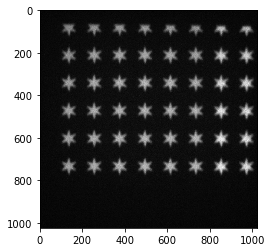

 64%|███████████████████████████████████████████████████▎                            | 123/192 [03:02<01:39,  1.45s/it]

FOV: 123, exposure_time: 150


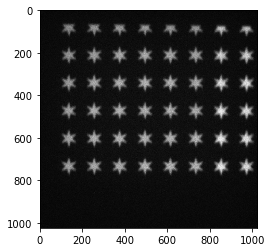

 65%|███████████████████████████████████████████████████▋                            | 124/192 [03:03<01:33,  1.38s/it]

FOV: 124, exposure_time: 150


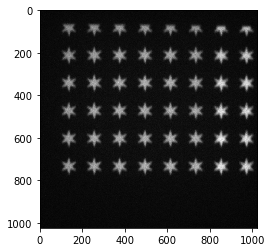

 65%|████████████████████████████████████████████████████                            | 125/192 [03:05<01:38,  1.48s/it]

FOV: 125, exposure_time: 150


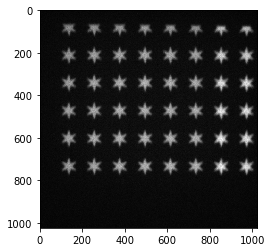

 66%|████████████████████████████████████████████████████▌                           | 126/192 [03:07<01:37,  1.48s/it]

FOV: 126, exposure_time: 150


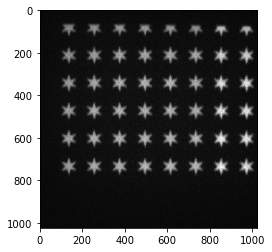

 66%|████████████████████████████████████████████████████▉                           | 127/192 [03:08<01:39,  1.53s/it]

FOV: 127, exposure_time: 150


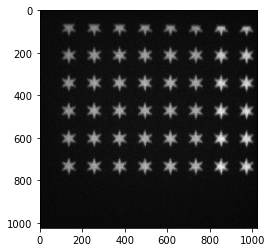

 67%|█████████████████████████████████████████████████████▎                          | 128/192 [03:10<01:42,  1.60s/it]

FOV: 128, exposure_time: 150


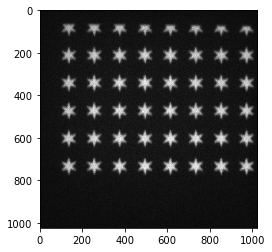

 67%|█████████████████████████████████████████████████████▊                          | 129/192 [03:12<01:44,  1.66s/it]

FOV: 129, exposure_time: 150


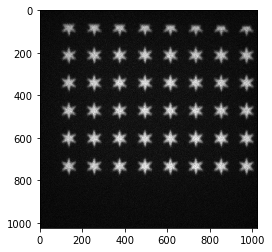

 68%|██████████████████████████████████████████████████████▏                         | 130/192 [03:13<01:39,  1.60s/it]

FOV: 130, exposure_time: 150


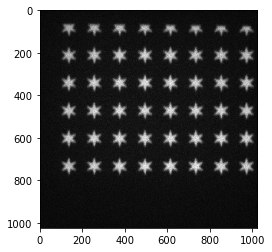

 68%|██████████████████████████████████████████████████████▌                         | 131/192 [03:15<01:36,  1.57s/it]

FOV: 131, exposure_time: 150


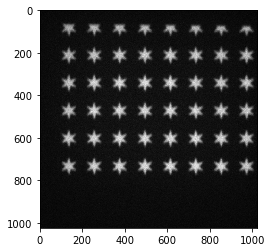

 69%|███████████████████████████████████████████████████████                         | 132/192 [03:16<01:28,  1.48s/it]

FOV: 132, exposure_time: 150


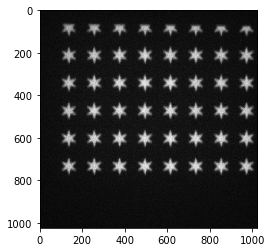

 69%|███████████████████████████████████████████████████████▍                        | 133/192 [03:18<01:31,  1.55s/it]

FOV: 133, exposure_time: 150


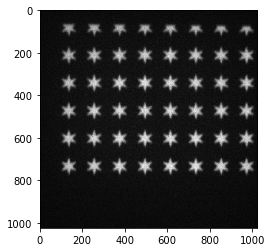

 70%|███████████████████████████████████████████████████████▊                        | 134/192 [03:19<01:27,  1.51s/it]

FOV: 134, exposure_time: 150


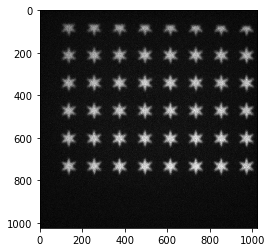

 70%|████████████████████████████████████████████████████████▎                       | 135/192 [03:21<01:26,  1.53s/it]

FOV: 135, exposure_time: 150


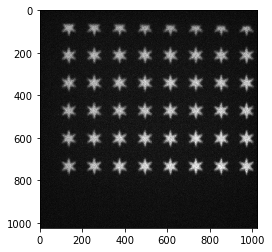

 71%|████████████████████████████████████████████████████████▋                       | 136/192 [03:22<01:23,  1.50s/it]

FOV: 136, exposure_time: 150


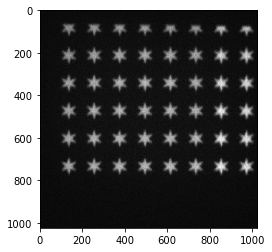

 71%|█████████████████████████████████████████████████████████                       | 137/192 [03:24<01:28,  1.61s/it]

FOV: 137, exposure_time: 150


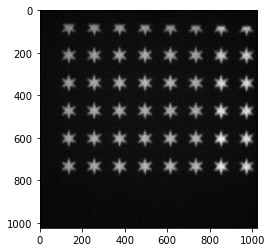

 72%|█████████████████████████████████████████████████████████▌                      | 138/192 [03:25<01:21,  1.51s/it]

FOV: 138, exposure_time: 150


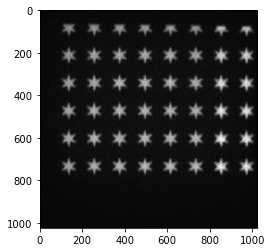

 72%|█████████████████████████████████████████████████████████▉                      | 139/192 [03:27<01:19,  1.49s/it]

FOV: 139, exposure_time: 150


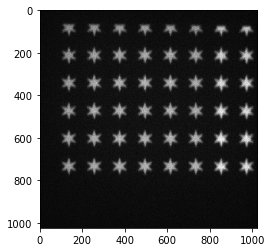

 73%|██████████████████████████████████████████████████████████▎                     | 140/192 [03:28<01:13,  1.42s/it]

FOV: 140, exposure_time: 150


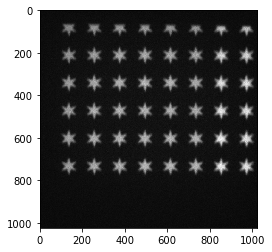

 73%|██████████████████████████████████████████████████████████▊                     | 141/192 [03:30<01:15,  1.48s/it]

FOV: 141, exposure_time: 150


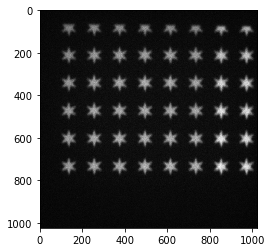

 74%|███████████████████████████████████████████████████████████▏                    | 142/192 [03:31<01:14,  1.50s/it]

FOV: 142, exposure_time: 150


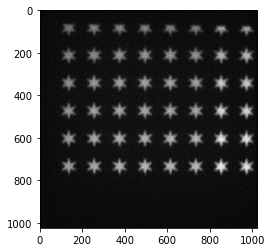

 74%|███████████████████████████████████████████████████████████▌                    | 143/192 [03:32<01:09,  1.42s/it]

FOV: 143, exposure_time: 150


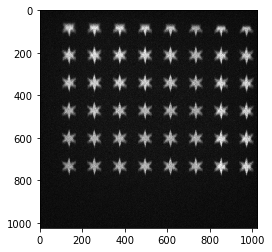

 75%|████████████████████████████████████████████████████████████                    | 144/192 [03:34<01:08,  1.43s/it]

FOV: 144, exposure_time: 150


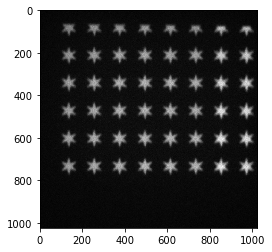

 76%|████████████████████████████████████████████████████████████▍                   | 145/192 [03:35<01:08,  1.46s/it]

FOV: 145, exposure_time: 150


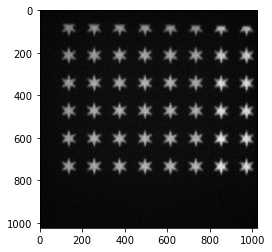

 76%|████████████████████████████████████████████████████████████▊                   | 146/192 [03:37<01:06,  1.44s/it]

FOV: 146, exposure_time: 150


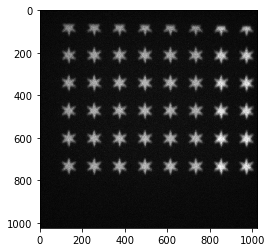

 77%|█████████████████████████████████████████████████████████████▎                  | 147/192 [03:38<01:05,  1.45s/it]

FOV: 147, exposure_time: 150


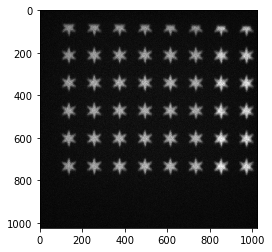

 77%|█████████████████████████████████████████████████████████████▋                  | 148/192 [03:40<01:03,  1.45s/it]

FOV: 148, exposure_time: 150


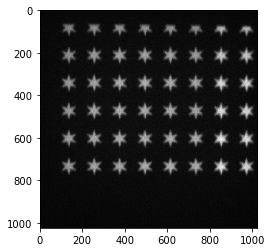

 78%|██████████████████████████████████████████████████████████████                  | 149/192 [03:41<01:03,  1.47s/it]

FOV: 149, exposure_time: 150


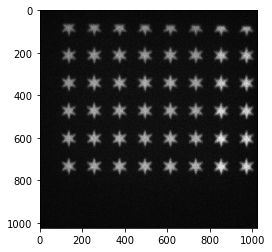

 78%|██████████████████████████████████████████████████████████████▌                 | 150/192 [03:43<01:02,  1.50s/it]

FOV: 150, exposure_time: 150


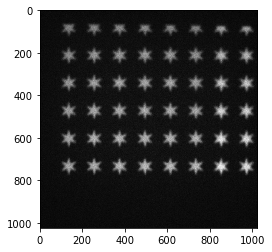

 79%|██████████████████████████████████████████████████████████████▉                 | 151/192 [03:44<01:00,  1.48s/it]

FOV: 151, exposure_time: 150


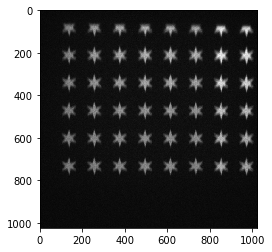

 79%|███████████████████████████████████████████████████████████████▎                | 152/192 [03:46<00:59,  1.50s/it]

FOV: 152, exposure_time: 150


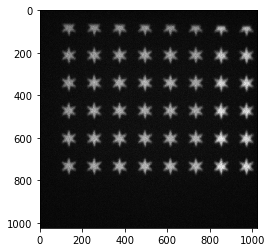

 80%|███████████████████████████████████████████████████████████████▊                | 153/192 [03:48<01:02,  1.61s/it]

FOV: 153, exposure_time: 150


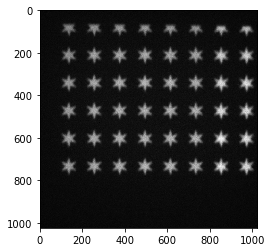

 80%|████████████████████████████████████████████████████████████████▏               | 154/192 [03:49<00:57,  1.51s/it]

FOV: 154, exposure_time: 150


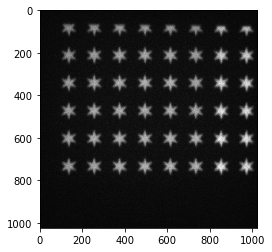

 81%|████████████████████████████████████████████████████████████████▌               | 155/192 [03:50<00:53,  1.43s/it]

FOV: 155, exposure_time: 150


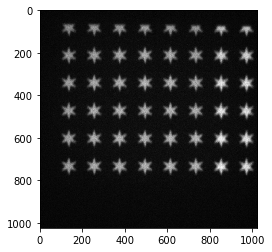

 81%|█████████████████████████████████████████████████████████████████               | 156/192 [03:52<00:53,  1.50s/it]

FOV: 156, exposure_time: 150


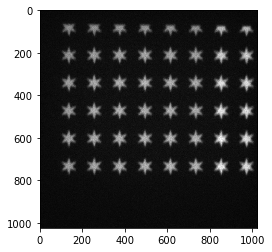

 82%|█████████████████████████████████████████████████████████████████▍              | 157/192 [03:54<00:55,  1.59s/it]

FOV: 157, exposure_time: 150


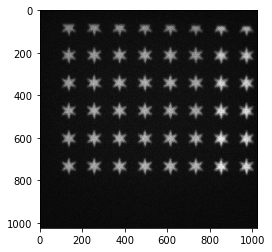

 82%|█████████████████████████████████████████████████████████████████▊              | 158/192 [03:55<00:50,  1.48s/it]

FOV: 158, exposure_time: 150


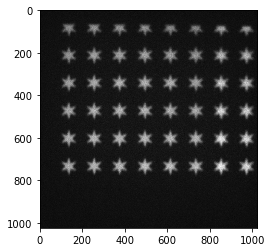

 83%|██████████████████████████████████████████████████████████████████▎             | 159/192 [03:56<00:48,  1.46s/it]

FOV: 159, exposure_time: 150


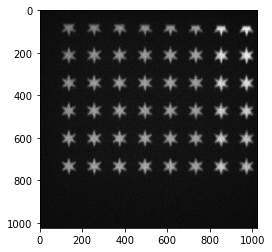

 83%|██████████████████████████████████████████████████████████████████▋             | 160/192 [03:58<00:46,  1.45s/it]

FOV: 160, exposure_time: 150


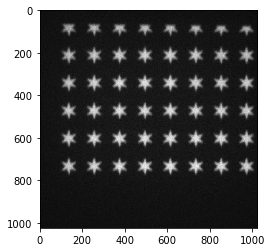

 84%|███████████████████████████████████████████████████████████████████             | 161/192 [03:59<00:47,  1.53s/it]

FOV: 161, exposure_time: 150


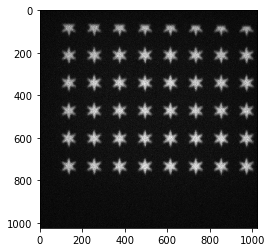

 84%|███████████████████████████████████████████████████████████████████▌            | 162/192 [04:01<00:44,  1.49s/it]

FOV: 162, exposure_time: 150


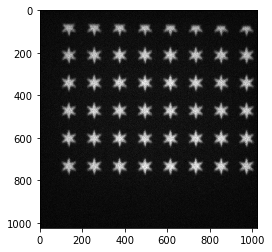

 85%|███████████████████████████████████████████████████████████████████▉            | 163/192 [04:02<00:40,  1.41s/it]

FOV: 163, exposure_time: 150


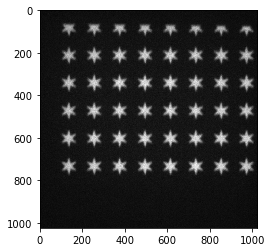

 85%|████████████████████████████████████████████████████████████████████▎           | 164/192 [04:04<00:41,  1.47s/it]

FOV: 164, exposure_time: 150


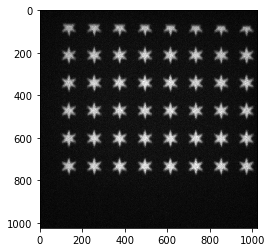

 86%|████████████████████████████████████████████████████████████████████▊           | 165/192 [04:05<00:40,  1.51s/it]

FOV: 165, exposure_time: 150


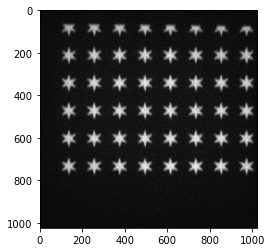

 86%|█████████████████████████████████████████████████████████████████████▏          | 166/192 [04:07<00:39,  1.51s/it]

FOV: 166, exposure_time: 150


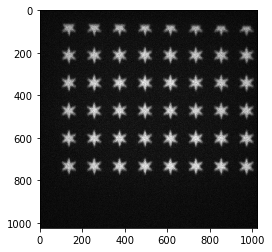

 87%|█████████████████████████████████████████████████████████████████████▌          | 167/192 [04:08<00:37,  1.50s/it]

FOV: 167, exposure_time: 150


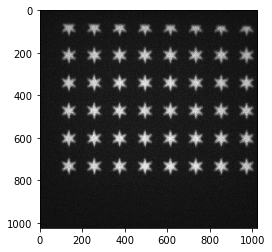

 88%|██████████████████████████████████████████████████████████████████████          | 168/192 [04:10<00:35,  1.49s/it]

FOV: 168, exposure_time: 150


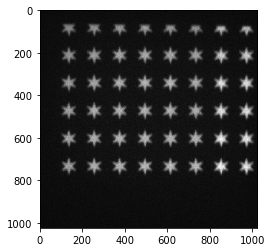

 88%|██████████████████████████████████████████████████████████████████████▍         | 169/192 [04:11<00:34,  1.48s/it]

FOV: 169, exposure_time: 150


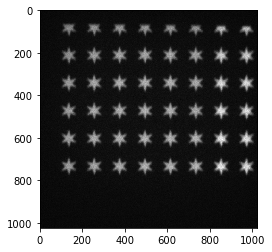

 89%|██████████████████████████████████████████████████████████████████████▊         | 170/192 [04:12<00:31,  1.42s/it]

FOV: 170, exposure_time: 150


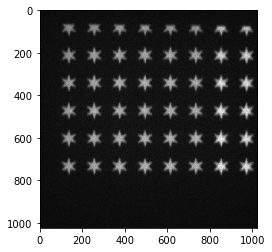

 89%|███████████████████████████████████████████████████████████████████████▎        | 171/192 [04:14<00:29,  1.39s/it]

FOV: 171, exposure_time: 150


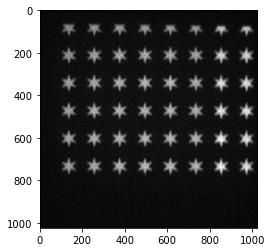

 90%|███████████████████████████████████████████████████████████████████████▋        | 172/192 [04:15<00:28,  1.42s/it]

FOV: 172, exposure_time: 150


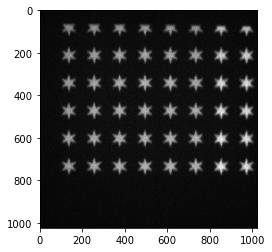

 90%|████████████████████████████████████████████████████████████████████████        | 173/192 [04:17<00:27,  1.43s/it]

FOV: 173, exposure_time: 150


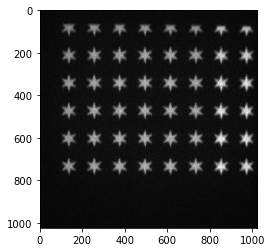

 91%|████████████████████████████████████████████████████████████████████████▌       | 174/192 [04:18<00:26,  1.45s/it]

FOV: 174, exposure_time: 150


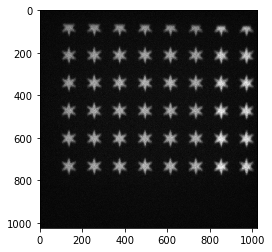

 91%|████████████████████████████████████████████████████████████████████████▉       | 175/192 [04:20<00:25,  1.50s/it]

FOV: 175, exposure_time: 150


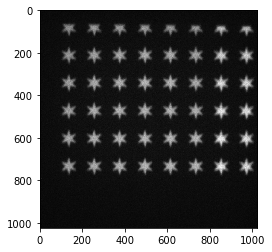

 92%|█████████████████████████████████████████████████████████████████████████▎      | 176/192 [04:21<00:22,  1.41s/it]

FOV: 176, exposure_time: 150


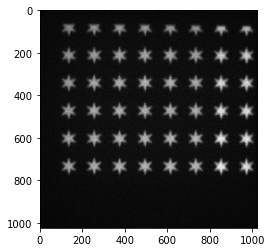

 92%|█████████████████████████████████████████████████████████████████████████▊      | 177/192 [04:23<00:23,  1.57s/it]

FOV: 177, exposure_time: 150


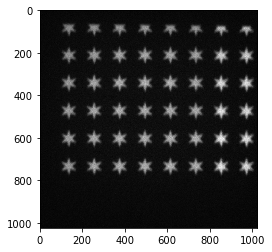

 93%|██████████████████████████████████████████████████████████████████████████▏     | 178/192 [04:24<00:20,  1.50s/it]

FOV: 178, exposure_time: 150


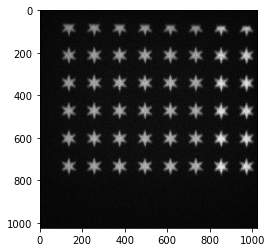

 93%|██████████████████████████████████████████████████████████████████████████▌     | 179/192 [04:26<00:19,  1.47s/it]

FOV: 179, exposure_time: 150


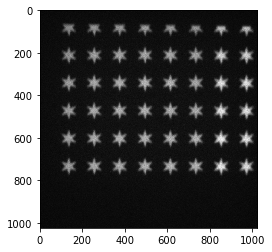

 94%|███████████████████████████████████████████████████████████████████████████     | 180/192 [04:27<00:18,  1.55s/it]

FOV: 180, exposure_time: 150


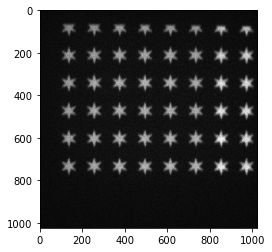

 94%|███████████████████████████████████████████████████████████████████████████▍    | 181/192 [04:29<00:17,  1.62s/it]

FOV: 181, exposure_time: 150


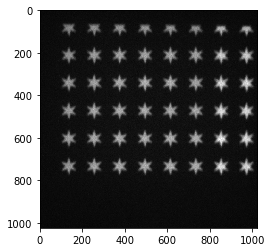

 95%|███████████████████████████████████████████████████████████████████████████▊    | 182/192 [04:31<00:15,  1.56s/it]

FOV: 182, exposure_time: 150


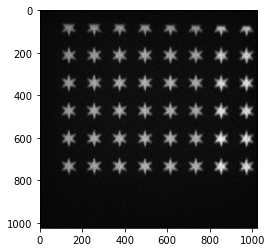

 95%|████████████████████████████████████████████████████████████████████████████▎   | 183/192 [04:32<00:13,  1.46s/it]

FOV: 183, exposure_time: 150


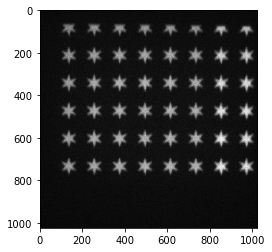

 96%|████████████████████████████████████████████████████████████████████████████▋   | 184/192 [04:33<00:11,  1.48s/it]

FOV: 184, exposure_time: 150


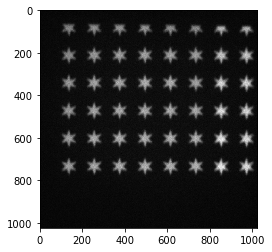

 96%|█████████████████████████████████████████████████████████████████████████████   | 185/192 [04:35<00:10,  1.49s/it]

FOV: 185, exposure_time: 150


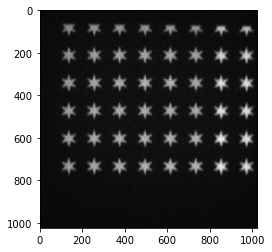

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 186/192 [04:36<00:08,  1.44s/it]

FOV: 186, exposure_time: 150


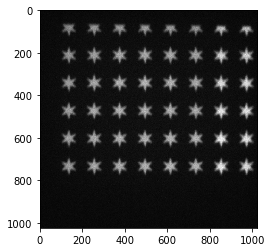

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 187/192 [04:38<00:07,  1.44s/it]

FOV: 187, exposure_time: 150


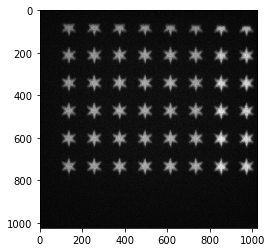

 98%|██████████████████████████████████████████████████████████████████████████████▎ | 188/192 [04:39<00:05,  1.45s/it]

FOV: 188, exposure_time: 150


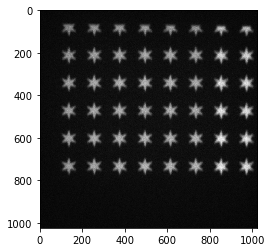

 98%|██████████████████████████████████████████████████████████████████████████████▊ | 189/192 [04:41<00:04,  1.53s/it]

FOV: 189, exposure_time: 150


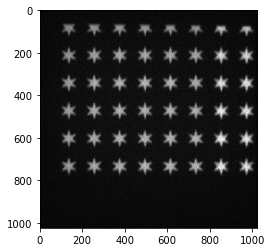

 99%|███████████████████████████████████████████████████████████████████████████████▏| 190/192 [04:42<00:03,  1.50s/it]

FOV: 190, exposure_time: 150


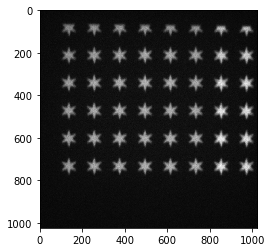

 99%|███████████████████████████████████████████████████████████████████████████████▌| 191/192 [04:44<00:01,  1.52s/it]

FOV: 191, exposure_time: 150


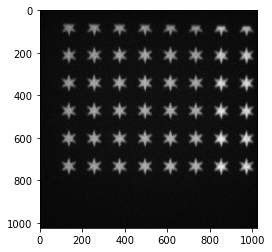

100%|████████████████████████████████████████████████████████████████████████████████| 192/192 [04:45<00:00,  1.49s/it]


In [88]:
# Create FOV objects from the positions (just run, nothing to change)
search_range = 15
memory = 5
position = 0.3
width = 4

## Try the patterns with the red LED
for mask in masks:
    plt.imshow(mask)
    plt.show()
    stim_img = acq_stim(mask,check_RED,affine,dmd)
    plt.imshow(stim_img)
    plt.show()


fovs = []

for pos_nb, pos in enumerate(position_list_interp[:]):
    treatment = "four_spots"
    fov = FOV(core, pos, treatment, pos_nb,  search_range, memory,0)
    fovs.append(fov)

    time_start = time.time()

    experiment_start_time = time.time()



for fov in tqdm(fovs):
        fov.move_stage_to_fov()
      #  fname = f'{str(fov.index).zfill(2)}_{str(time_step).zfill(5)}'

        #exposure_time = exposure_times[fov.index]
        pattern = masks[pattern_ids[fov.index]]

        expose_UV.camera_exposure_time = int(exposure_time) #150
        stim_img = acq_stim(pattern,expose_UV,affine,dmd)
        
        print(f'FOV: {fov.index}, exposure_time: {exposure_time}')
        plt.imshow(stim_img,cmap = 'gray')
        plt.show()

        #io.imsave(output_path+'raw\\'+str(fov.index).zfill(3)+'.tiff', stim_img)

    #    fov.tracks = tracks

        #print(stim_frame)
        #print(fname)


       # time_stop = time.time()
       # processing_time = time_stop - time_start


In [ ]:
    expose_UV.camera_exposure_time = 100    
    stim_img = acq_stim(np.ones((1024,1024)),expose_UV,affine,dmd)


In [ ]:
pattern_ids[fov.index]

In [ ]:
io.imsave('Z:/PertzLab/rberthoz/masks/stim_img_DMD_FOV_TEST.tiff',stim_img)